In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torch
import torch.utils.data
from scipy.io import loadmat
from skimage import io
import spectral

In [2]:
from scipy.io import loadmat, whosmat

# Inspect the contents of the .mat file
mat_contents_img = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\KSC\KSC.mat")
mat_contents_gt = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\KSC\KSC_gt.mat")

print(mat_contents_img)
print(mat_contents_gt)

[('KSC', (512, 614, 176), 'double')]
[('KSC_gt', (512, 614), 'double')]


In [3]:
img = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\KSC\KSC.mat")['KSC']
gt = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\KSC\KSC_gt.mat")['KSC_gt']

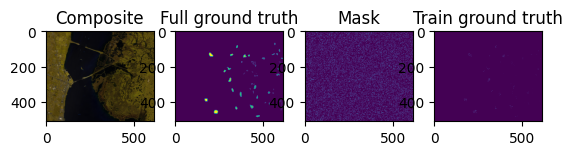

In [4]:
mask = np.random.randint(0, 100, gt.shape) < 5
train_gt = np.copy(gt)
train_gt[np.nonzero(~mask)] = 0
test_gt = np.copy(gt)
test_gt[train_gt > 0] = 0

rgb = img[:,:,(55,41,12)]
rgb = (255 * (rgb.astype(np.float32) - rgb.min())/(rgb.max() - rgb.min())).astype(np.uint8)
fig = plt.figure()
fig.add_subplot(141)
plt.imshow(rgb)
plt.title("Composite")
fig.add_subplot(142)
plt.imshow(gt)
plt.title("Full ground truth")
fig.add_subplot(143)
plt.imshow(mask)
plt.title("Mask")
fig.add_subplot(144)
plt.imshow(train_gt)
plt.title("Train ground truth")
plt.show()

In [5]:
from skimage import morphology

class HyperX(torch.utils.data.Dataset):
    
    def __init__(self, data, ground_truth, semi=False):
        super(HyperX, self).__init__()
        # Normalize the data in [0,1]
        data = (data - data.min()) / (data.max() - data.min())
        self.data = data
        self.gt = ground_truth
        self.n_classes = len(np.unique(ground_truth))
        if semi:
            # Semi-supervision, include neighbours at 50px
            x_pos, y_pos = np.nonzero(morphology.dilation(ground_truth > 0, morphology.disk(50)))
        else:
            x_pos, y_pos = np.nonzero(ground_truth)
        self.indices = [idx for idx in zip(x_pos, y_pos)]
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, i):
        x, y = self.indices[i]
        data = self.data[x,y]
        # Get the label in one-hot encoded style
        label = np.asarray(np.eye(self.n_classes)[self.gt[x, y]], dtype='int64')
        return torch.from_numpy(data), torch.from_numpy(label)

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

        
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            nn.Linear(z_dim + c_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, X_dim),
            nn.Sigmoid()
        )
        self.apply(weight_init)

    def forward(self, z, c):
        inputs = torch.cat([z, c], dim=1)
        return self.generator(inputs)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, 1)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.discriminator(x)
    
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.BatchNorm1d(h_dim),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, c_dim)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.classifier(x)


In [7]:
mb_size = 256 # Batch size
z_dim = 30   # Noise dimension
X_dim = img.shape[-1] # Number of bands
h_dim = 512  # Hidden layer size
d_step = 5   # Number of discriminator training steps for each generator training step
lr = 5e-5    # Learning rate
c_weight = 0.2 # Auxiliary classifier weight
flip_percentage = 0.0 # Proportion of label flipping
mixup_alpha = 0.1 # Mixup
semi_supervised = True # semi-supervision (set to True to include unlabeled samples)

# Build the dataset and data loader
data_loader = torch.utils.data.DataLoader(
    HyperX(img, train_gt if semi_supervised else gt), batch_size=mb_size, shuffle=True)
# c_dim = condition vector size
c_dim = data_loader.dataset.n_classes

# Ignore the class 0
class_weights = torch.ones((c_dim))
class_weights[0] = 0.
class_weights = class_weights.cuda()

In [8]:
# Initialize weights using the He et al. (2015) policy.
def weight_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d, nn.Conv3d, nn.ConvTranspose3d)):
        torch.nn.init.kaiming_normal_(m.weight.data)

# Spherical interpolation between two vectors on the unit hypersphere
# See : https://github.com/soumith/dcgan.torch/issues/14
def slerp(val, low, high):
    omega = np.arccos(np.clip(np.dot(low/np.linalg.norm(low), high/np.linalg.norm(high)), -1, 1))
    so = np.sin(omega)
    if so == 0:
        return (1.0-val) * low + val * high # L'Hopital's rule/LERP
    return np.sin((1.0-val)*omega) / so * low + np.sin(val*omega) / so * high

def lerp(val, low, high):
    return (1.0-val) * low + val * high # L'Hopital's rule/LERP

# Gradient penalty from the Improved WGAN training
# From : https://github.com/EmilienDupont/wgan-gp
# Use penalty_weight set at 10, as suggested in the paper
def calc_gradient_penalty(netD, real_data, generated_data, penalty_weight=10):
        batch_size = real_data.size()[0]

        alpha = torch.rand(batch_size, 1) if real_data.dim() == 2 else torch.rand(batch_size, 1, 1, 1)
        alpha = alpha.expand_as(real_data)
        alpha = alpha.cuda()
        
        interpolated = alpha * real_data + (1 - alpha) * generated_data
        #interpolated = Variable(interpolated, requires_grad=True)
        interpolated.requires_grad_()
        interpolated = interpolated.cuda()

        # Calculate probability of interpolated examples
        prob_interpolated = netD(interpolated)

        # Calculate gradients of probabilities with respect to examples
        gradients = torch.autograd.grad(outputs=prob_interpolated, inputs=interpolated,
                               grad_outputs=torch.ones(prob_interpolated.size()).cuda(),
                               create_graph=True, retain_graph=True)[0]

        # Gradients have shape (batch_size, num_channels, img_width, img_height),
        # so flatten to easily take norm per example in batch
        gradients = gradients.view(batch_size, -1)

        # Derivatives of the gradient close to 0 can cause problems because of
        # the square root, so manually calculate norm and add epsilon
        gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

        # Return gradient penalty
        return penalty_weight * ((gradients_norm - 1) ** 2).mean()
    
def reset_grad(*nets):
    for net in nets:
        net.zero_grad()
        
def plot_mean_std(samples):
    mean_spectrum = np.mean(samples, axis=0)
    std_spectrum = np.std(samples, axis=0)
    plt.plot(mean_spectrum - std_spectrum, linestyle='dotted', label='-std')
    plt.plot(mean_spectrum, label='mean')
    plt.plot(mean_spectrum + std_spectrum, linestyle='dotted', label='+std')

  0%|                                                                                       | 0/100000 [00:00<?, ?it/s]C:\Users\ursti\AppData\Local\Temp\ipykernel_9144\1864507184.py:65: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  pred = F.log_softmax(C(X))


Iter-0; D_loss: 324.1278076171875; G_loss: 0.5892238616943359; C_loss: 4.522585868835449


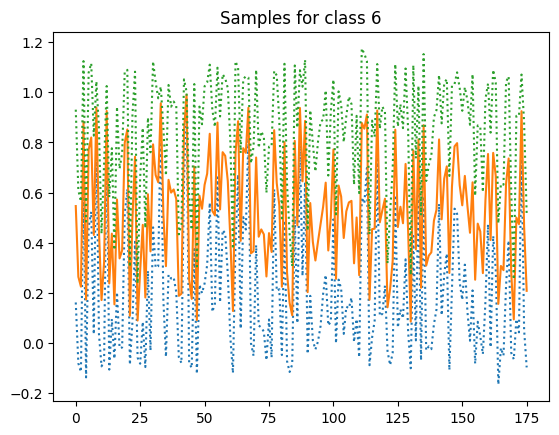

  1%|▋                                                                         | 1000/100000 [01:11<2:16:59, 12.05it/s]

Iter-1000; D_loss: 0.039414115250110626; G_loss: -0.5862283110618591; C_loss: 1.569668173789978


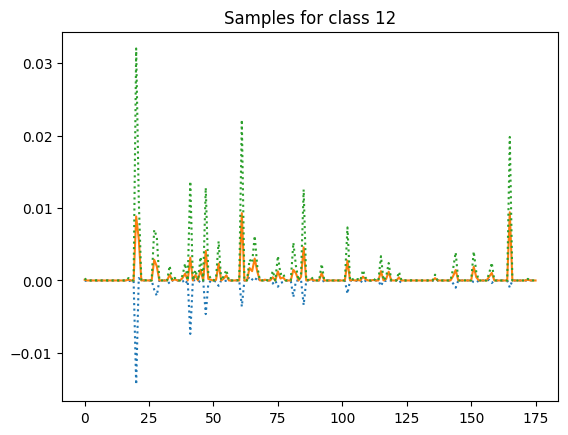

  2%|█▍                                                                        | 1999/100000 [02:31<2:15:41, 12.04it/s]

Iter-2000; D_loss: -0.004767911974340677; G_loss: -0.9381527304649353; C_loss: 0.6884541511535645


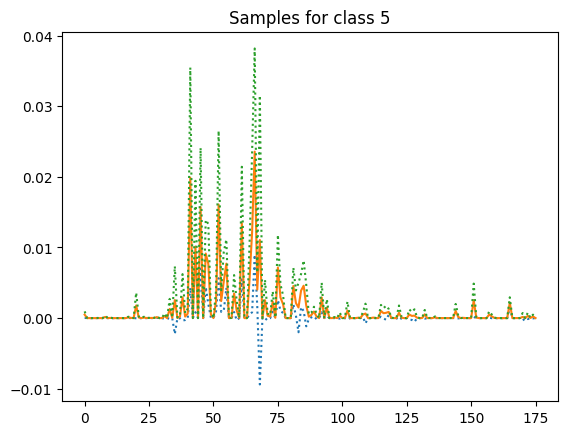

  3%|██▏                                                                       | 2999/100000 [03:43<1:53:56, 14.19it/s]

Iter-3000; D_loss: 0.014587702229619026; G_loss: -0.3529384136199951; C_loss: 0.49511995911598206


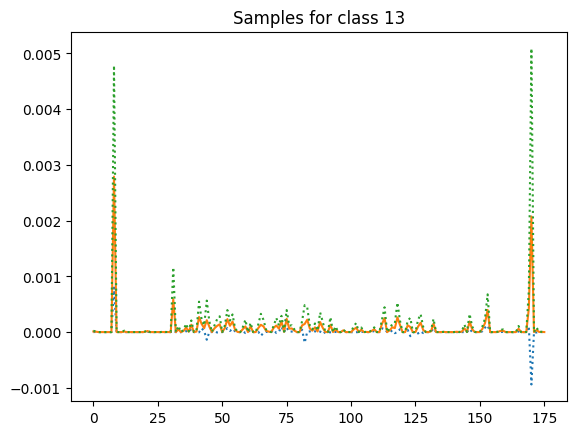

  4%|██▉                                                                       | 4000/100000 [04:56<1:47:54, 14.83it/s]

Iter-4000; D_loss: 0.011146049946546555; G_loss: -0.875059187412262; C_loss: 0.3200731873512268


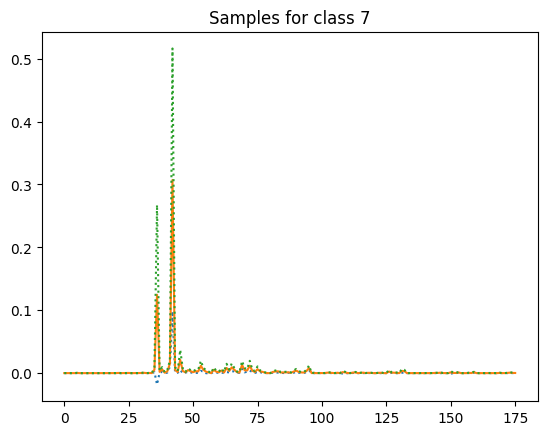

  5%|███▋                                                                      | 5000/100000 [06:08<2:09:56, 12.18it/s]

Iter-5000; D_loss: 0.00753692165017128; G_loss: -0.6956315636634827; C_loss: 0.3275679349899292


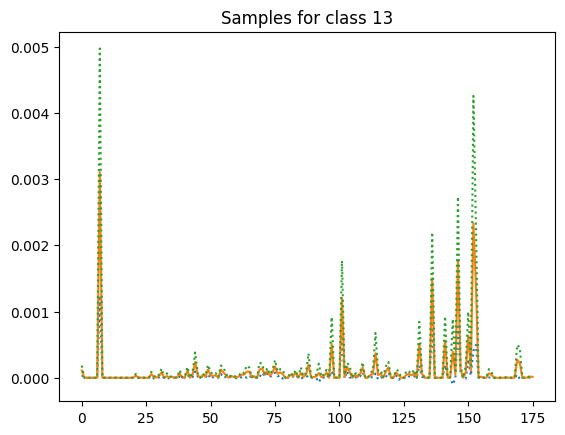

  6%|████▍                                                                     | 5999/100000 [07:21<1:50:24, 14.19it/s]

Iter-6000; D_loss: -0.004201049450784922; G_loss: -2.3337888717651367; C_loss: 0.33172398805618286


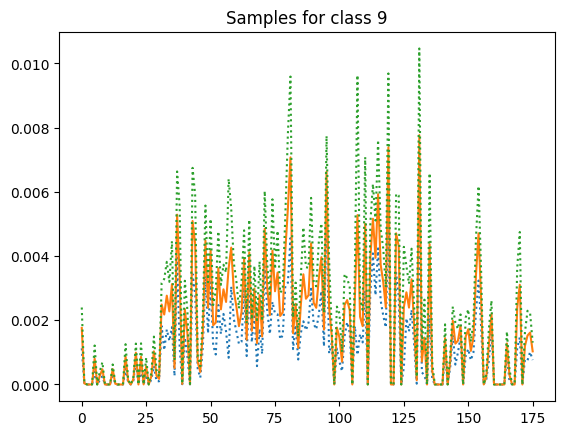

  7%|█████▏                                                                    | 6999/100000 [08:34<1:50:54, 13.98it/s]

Iter-7000; D_loss: 0.006370904855430126; G_loss: -0.5839645266532898; C_loss: 0.2069821059703827


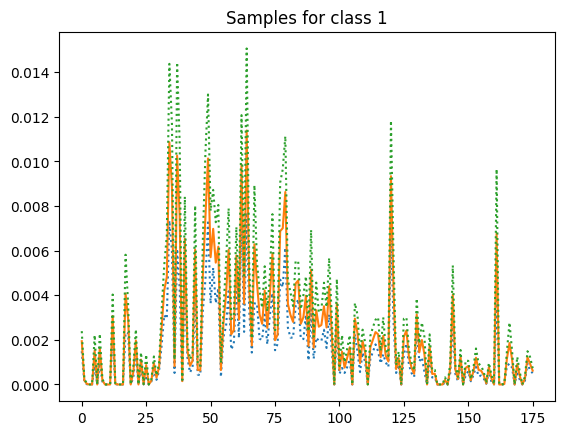

  8%|█████▉                                                                    | 8000/100000 [09:47<1:59:28, 12.83it/s]

Iter-8000; D_loss: -0.004550911020487547; G_loss: 0.4634644389152527; C_loss: 0.12650258839130402


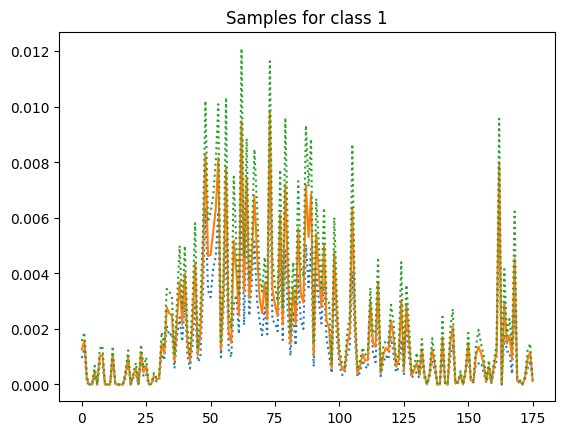

  9%|██████▋                                                                   | 9000/100000 [11:00<1:45:17, 14.40it/s]

Iter-9000; D_loss: 0.0017911791801452637; G_loss: -0.15045136213302612; C_loss: 0.11597467213869095


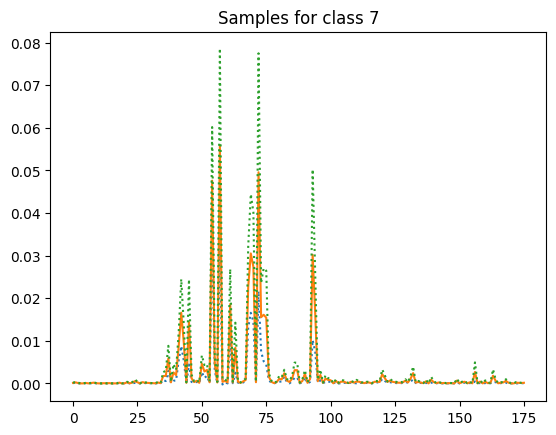

 10%|███████▎                                                                 | 10000/100000 [12:13<1:46:36, 14.07it/s]

Iter-10000; D_loss: -0.0004909532144665718; G_loss: -0.197085440158844; C_loss: 0.1486407220363617


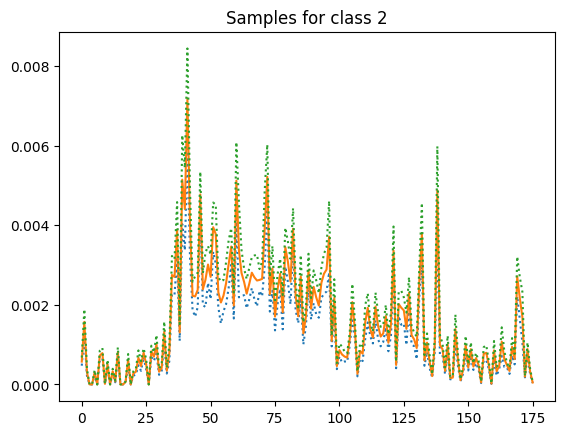

 11%|████████                                                                 | 10999/100000 [13:27<1:55:59, 12.79it/s]

Iter-11000; D_loss: -0.0035710101947188377; G_loss: 0.4548090994358063; C_loss: 0.07973447442054749


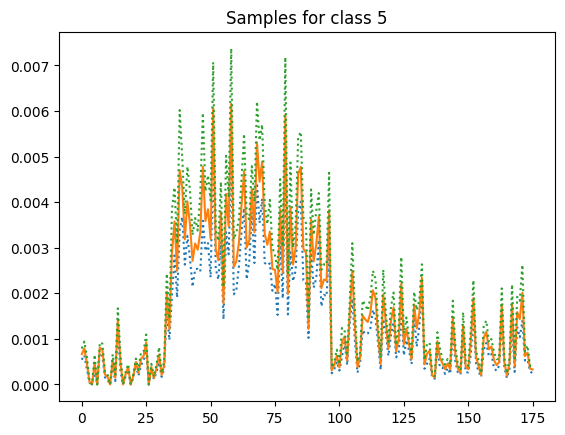

 12%|████████▊                                                                | 11999/100000 [14:40<1:40:59, 14.52it/s]

Iter-12000; D_loss: -0.006815989967435598; G_loss: 0.6258105039596558; C_loss: 0.06680349260568619


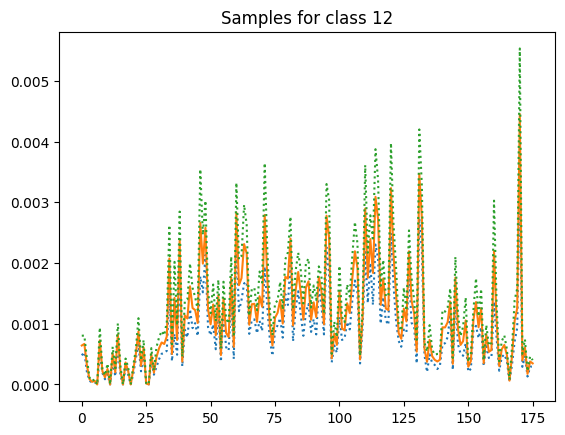

 13%|█████████▍                                                               | 13000/100000 [15:55<1:41:38, 14.27it/s]

Iter-13000; D_loss: -0.00013163406401872635; G_loss: 0.8918812274932861; C_loss: 0.06548763066530228


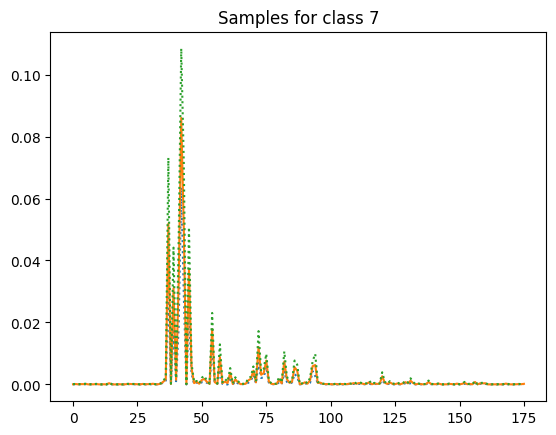

 14%|██████████▏                                                              | 14000/100000 [17:09<1:49:13, 13.12it/s]

Iter-14000; D_loss: -0.007055508904159069; G_loss: 0.5386771559715271; C_loss: 0.11816287785768509


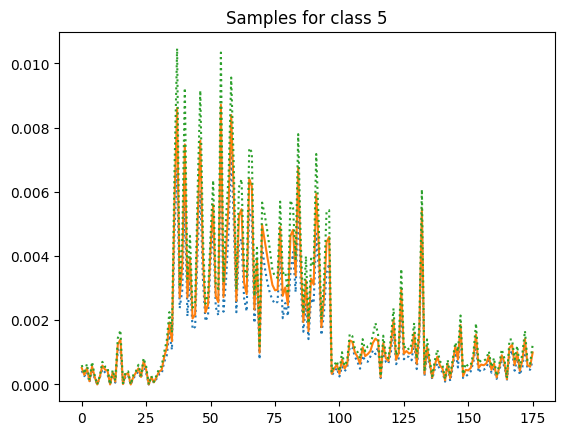

 15%|██████████▉                                                              | 14999/100000 [18:22<1:54:26, 12.38it/s]

Iter-15000; D_loss: -0.0010017398744821548; G_loss: 0.3501785695552826; C_loss: 0.10207413136959076


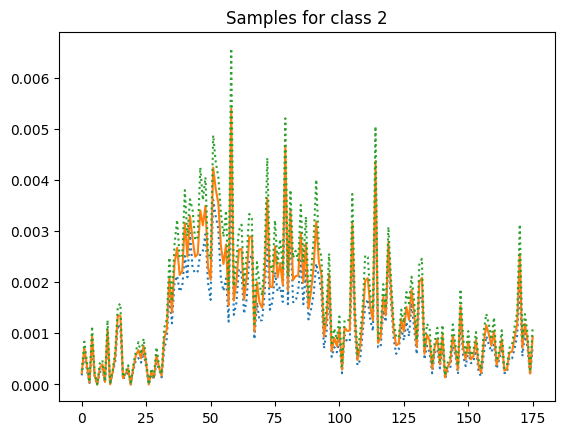

 16%|███████████▋                                                             | 15999/100000 [19:37<1:44:00, 13.46it/s]

Iter-16000; D_loss: 0.002682172693312168; G_loss: 0.05489864572882652; C_loss: 0.02805085852742195


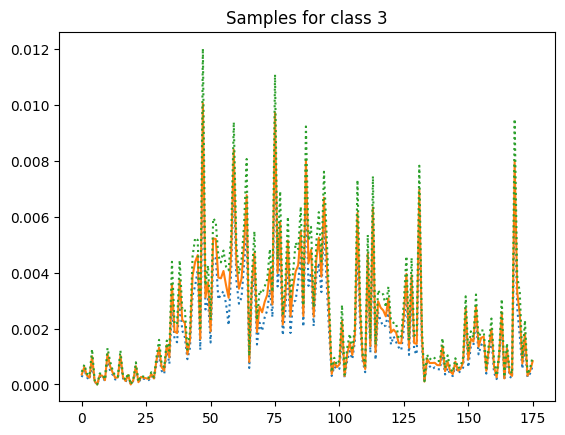

 17%|████████████▍                                                            | 16999/100000 [20:51<1:39:27, 13.91it/s]

Iter-17000; D_loss: -0.008190554566681385; G_loss: 0.07680737972259521; C_loss: 0.021674226969480515


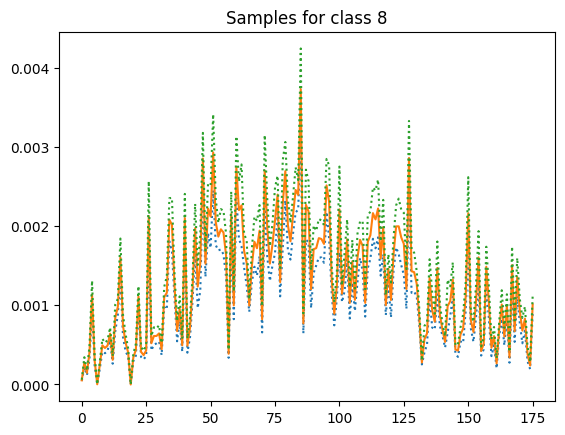

 18%|█████████████▏                                                           | 18000/100000 [22:05<1:45:48, 12.92it/s]

Iter-18000; D_loss: -0.0014147106558084488; G_loss: -0.07273773103952408; C_loss: 0.04628659039735794


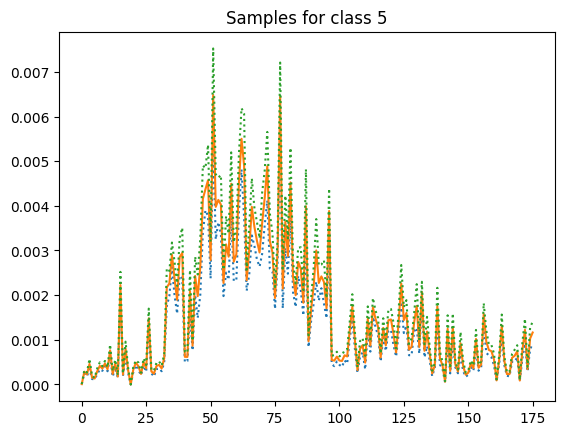

 19%|█████████████▊                                                           | 18999/100000 [23:20<1:46:40, 12.66it/s]

Iter-19000; D_loss: -0.009153955616056919; G_loss: -0.5739009976387024; C_loss: 0.025421883910894394


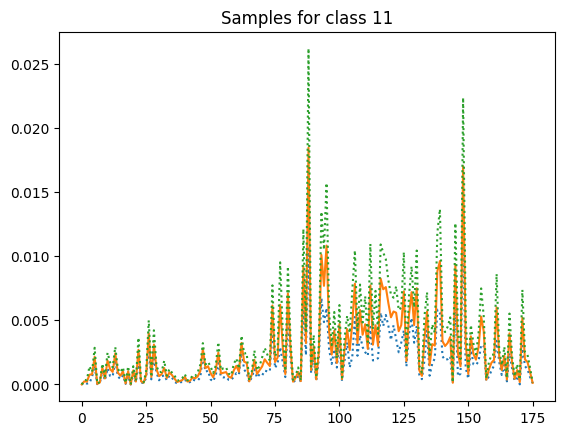

 20%|██████████████▌                                                          | 19999/100000 [24:34<1:28:55, 15.00it/s]

Iter-20000; D_loss: -0.0035576983354985714; G_loss: -0.9682698845863342; C_loss: 0.029443174600601196


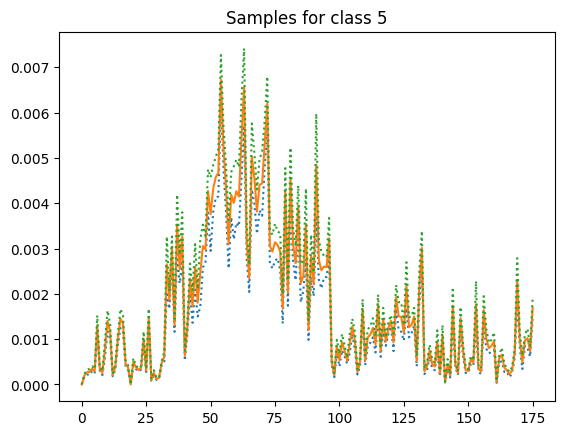

 21%|███████████████▎                                                         | 21000/100000 [25:49<1:43:32, 12.72it/s]

Iter-21000; D_loss: 0.007057790644466877; G_loss: -1.246804118156433; C_loss: 0.036190345883369446


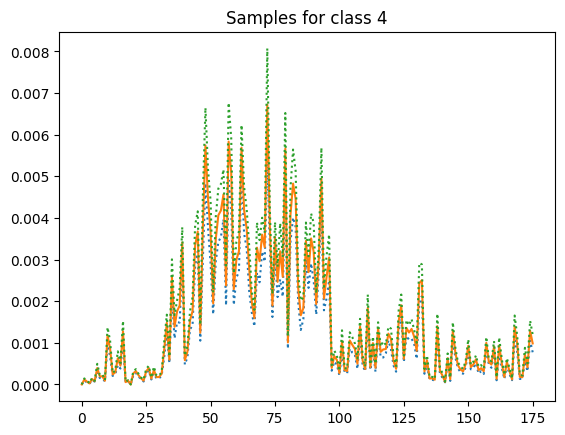

 22%|████████████████                                                         | 22000/100000 [27:03<1:34:57, 13.69it/s]

Iter-22000; D_loss: -0.011171062476933002; G_loss: -2.0864503383636475; C_loss: 0.042853184044361115


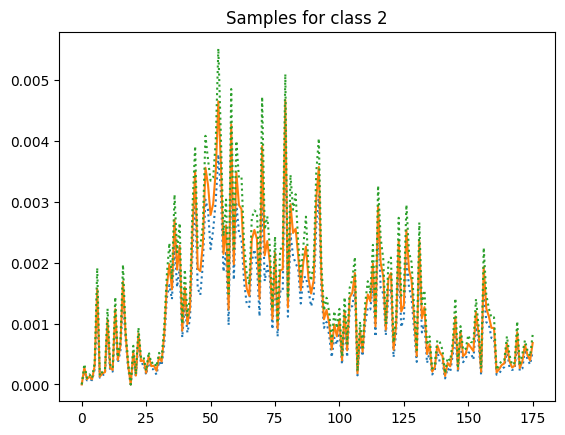

 23%|████████████████▊                                                        | 23000/100000 [28:18<1:36:32, 13.29it/s]

Iter-23000; D_loss: -0.0028915670700371265; G_loss: -2.9150516986846924; C_loss: 0.05676447972655296


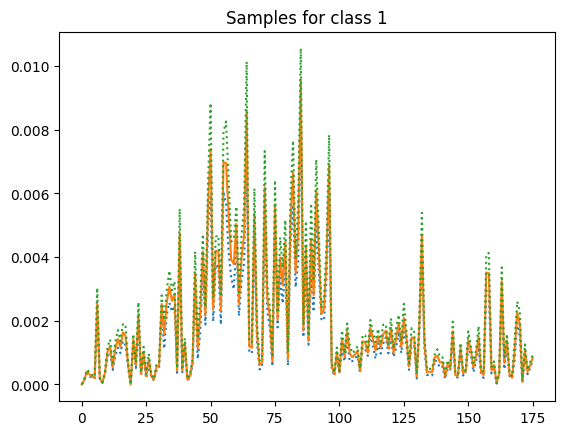

 24%|█████████████████▌                                                       | 24000/100000 [29:31<1:34:30, 13.40it/s]

Iter-24000; D_loss: 0.0010576946660876274; G_loss: -2.774442195892334; C_loss: 0.011720117181539536


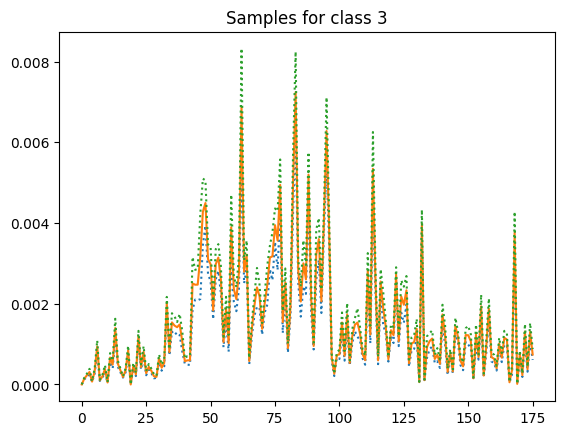

 25%|██████████████████▏                                                      | 24999/100000 [30:45<1:23:17, 15.01it/s]

Iter-25000; D_loss: 0.0012628855183720589; G_loss: -3.7078988552093506; C_loss: 0.019376324489712715


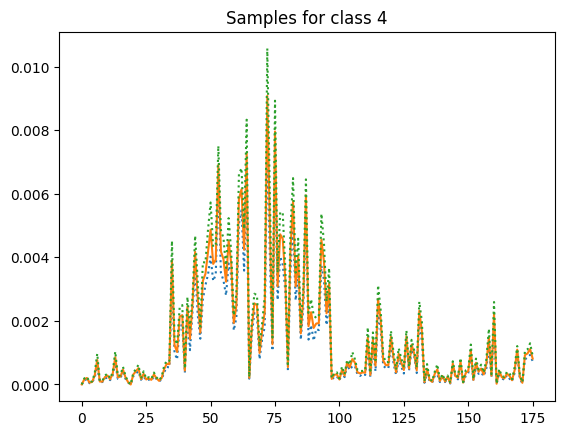

 26%|██████████████████▉                                                      | 26000/100000 [32:00<1:28:27, 13.94it/s]

Iter-26000; D_loss: -0.010963907465338707; G_loss: -4.57241153717041; C_loss: 0.01803012005984783


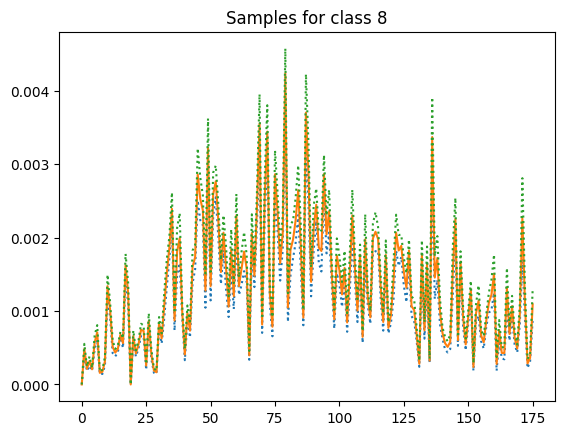

 27%|███████████████████▋                                                     | 26999/100000 [33:15<1:24:36, 14.38it/s]

Iter-27000; D_loss: -0.006251949351280928; G_loss: -5.809637069702148; C_loss: 0.05190185084939003


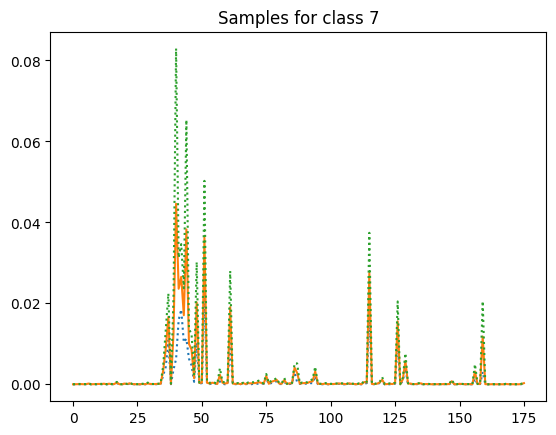

 28%|████████████████████▍                                                    | 27999/100000 [34:30<1:28:35, 13.54it/s]

Iter-28000; D_loss: -0.0005911476910114288; G_loss: -6.91565465927124; C_loss: 0.059387221932411194


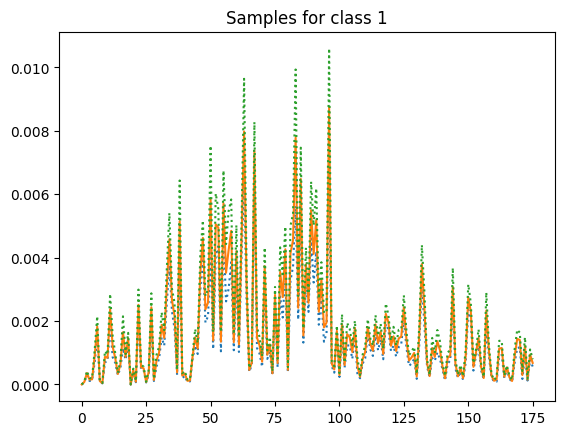

 29%|█████████████████████▏                                                   | 28999/100000 [35:43<1:23:13, 14.22it/s]

Iter-29000; D_loss: -0.0088695352897048; G_loss: -8.360906600952148; C_loss: 0.02570757083594799


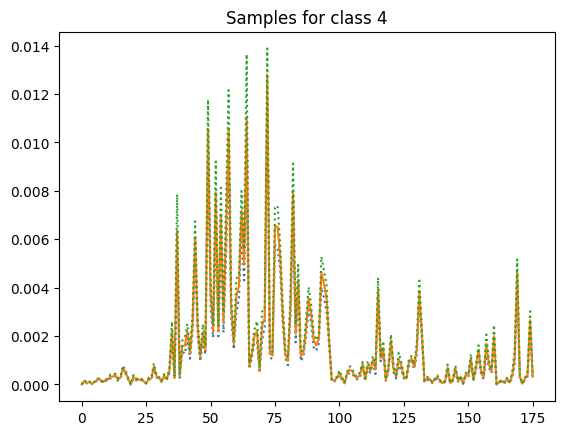

 30%|█████████████████████▉                                                   | 30000/100000 [36:59<1:26:17, 13.52it/s]

Iter-30000; D_loss: -0.006596914958208799; G_loss: -9.096647262573242; C_loss: 0.014796795323491096


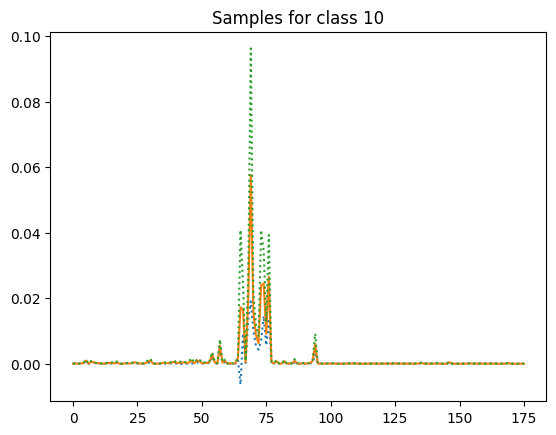

 31%|██████████████████████▋                                                  | 30999/100000 [38:13<1:25:39, 13.42it/s]

Iter-31000; D_loss: 0.003102801740169525; G_loss: -10.021405220031738; C_loss: 0.06372325867414474


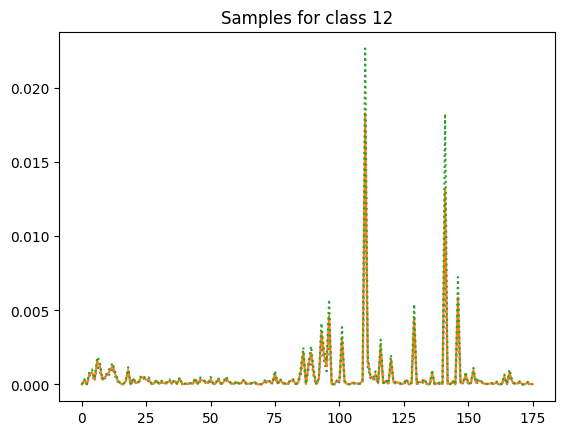

 32%|███████████████████████▎                                                 | 31999/100000 [39:27<1:21:17, 13.94it/s]

Iter-32000; D_loss: -0.007284891791641712; G_loss: -10.92809009552002; C_loss: 0.009030215442180634


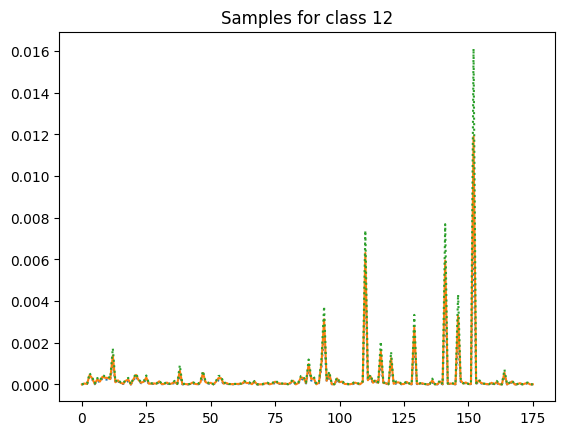

 33%|████████████████████████                                                 | 32999/100000 [40:41<1:33:18, 11.97it/s]

Iter-33000; D_loss: -0.007177179213613272; G_loss: -11.298141479492188; C_loss: 0.02401040308177471


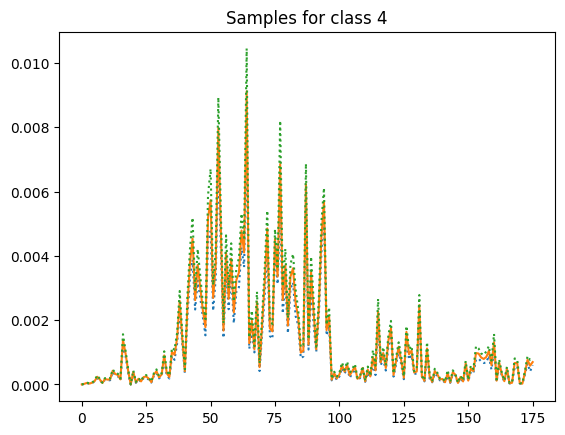

 34%|████████████████████████▊                                                | 33999/100000 [41:55<1:27:38, 12.55it/s]

Iter-34000; D_loss: -0.009687635116279125; G_loss: -11.671128273010254; C_loss: 0.01850023865699768


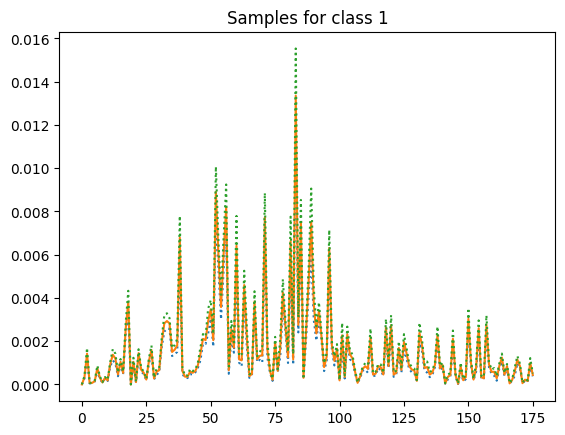

 35%|█████████████████████████▌                                               | 35000/100000 [43:10<1:23:20, 13.00it/s]

Iter-35000; D_loss: -0.008733497932553291; G_loss: -12.581673622131348; C_loss: 0.025110606104135513


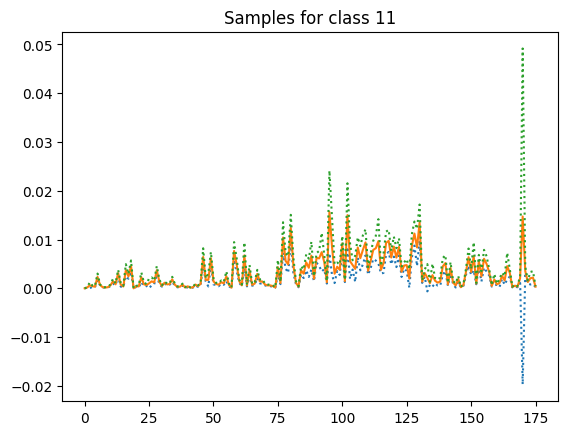

 36%|██████████████████████████▎                                              | 35999/100000 [44:23<1:23:14, 12.81it/s]

Iter-36000; D_loss: -0.008276183158159256; G_loss: -13.607843399047852; C_loss: 0.011174023151397705


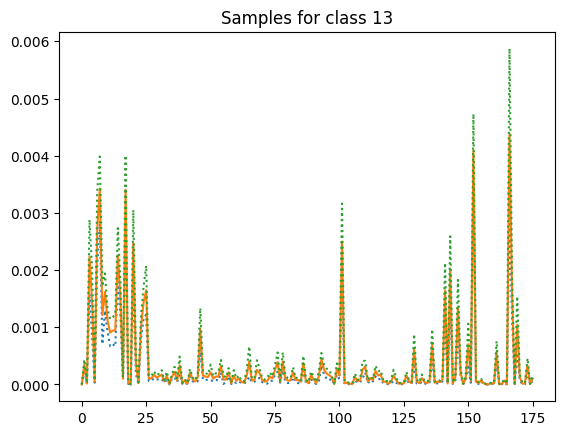

 37%|███████████████████████████                                              | 37000/100000 [45:38<1:17:31, 13.54it/s]

Iter-37000; D_loss: -0.019120343029499054; G_loss: -16.229839324951172; C_loss: 0.04917820170521736


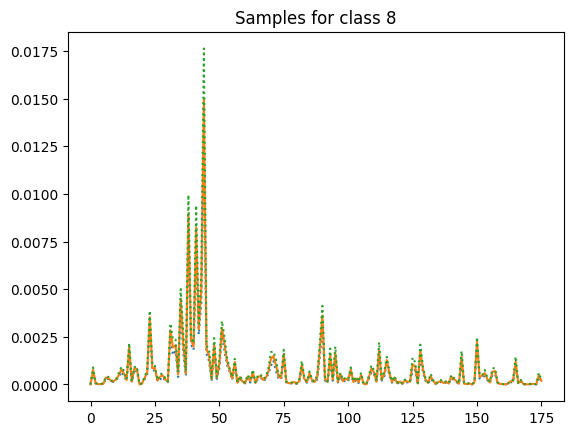

 38%|███████████████████████████▋                                             | 38000/100000 [46:52<1:25:14, 12.12it/s]

Iter-38000; D_loss: -0.011673465371131897; G_loss: -14.285439491271973; C_loss: 0.028180023655295372


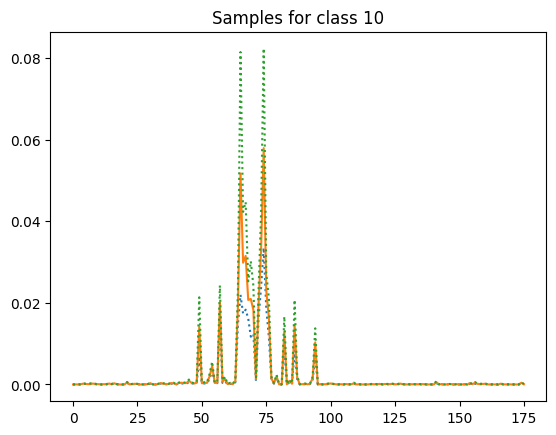

 39%|████████████████████████████▍                                            | 39000/100000 [48:06<1:11:00, 14.32it/s]

Iter-39000; D_loss: -0.012913929298520088; G_loss: -14.690996170043945; C_loss: 0.021910643205046654


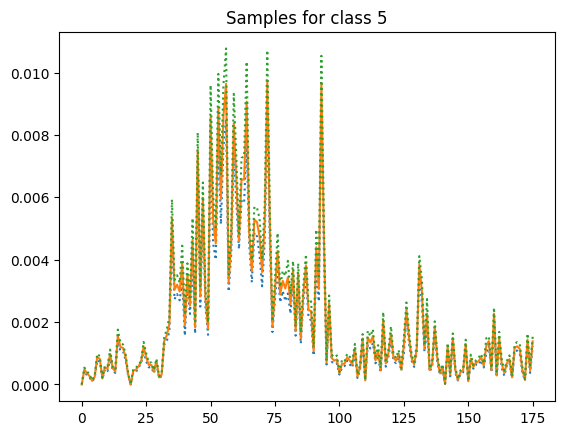

 40%|█████████████████████████████▏                                           | 40000/100000 [49:21<1:10:51, 14.11it/s]

Iter-40000; D_loss: -0.00993611291050911; G_loss: -15.283815383911133; C_loss: 0.033213600516319275


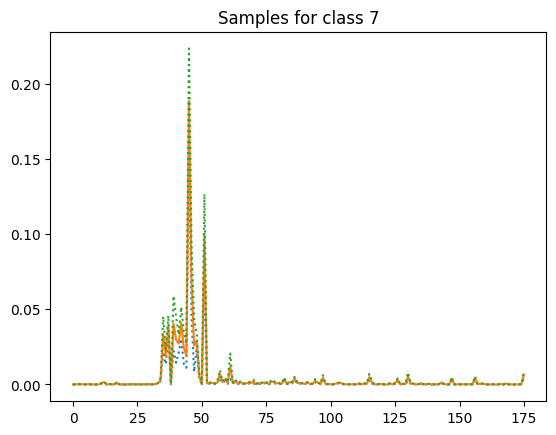

 41%|█████████████████████████████▉                                           | 40999/100000 [50:35<1:16:47, 12.80it/s]

Iter-41000; D_loss: 0.006272623315453529; G_loss: -15.68244743347168; C_loss: 0.028817346319556236


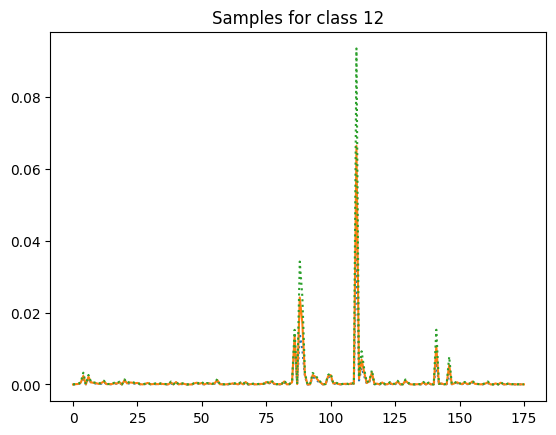

 42%|██████████████████████████████▋                                          | 41999/100000 [51:49<1:17:20, 12.50it/s]

Iter-42000; D_loss: -0.005117752589285374; G_loss: -17.431236267089844; C_loss: 0.013246751390397549


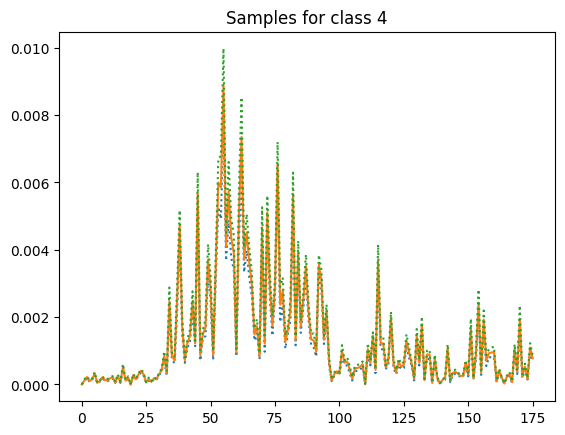

 43%|███████████████████████████████▍                                         | 43000/100000 [53:04<1:08:29, 13.87it/s]

Iter-43000; D_loss: -0.010473232716321945; G_loss: -19.242395401000977; C_loss: 0.013170789927244186


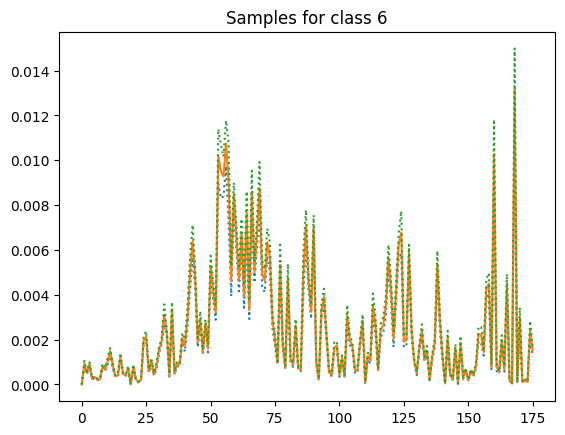

 44%|████████████████████████████████                                         | 43999/100000 [54:19<1:06:04, 14.13it/s]

Iter-44000; D_loss: -0.013632379472255707; G_loss: -18.12203598022461; C_loss: 0.009907846339046955


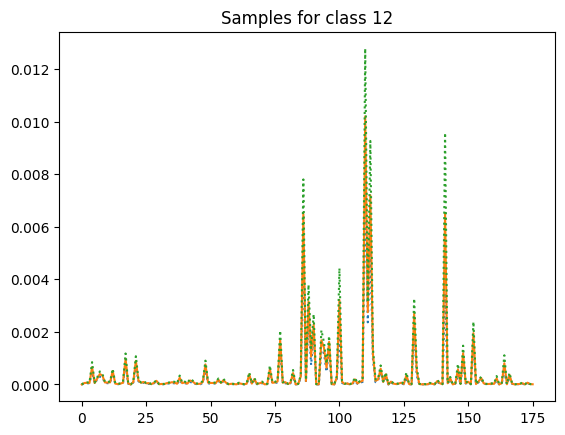

 45%|████████████████████████████████▊                                        | 45000/100000 [55:34<1:15:25, 12.15it/s]

Iter-45000; D_loss: -0.005913799628615379; G_loss: -18.439247131347656; C_loss: 0.1290859580039978


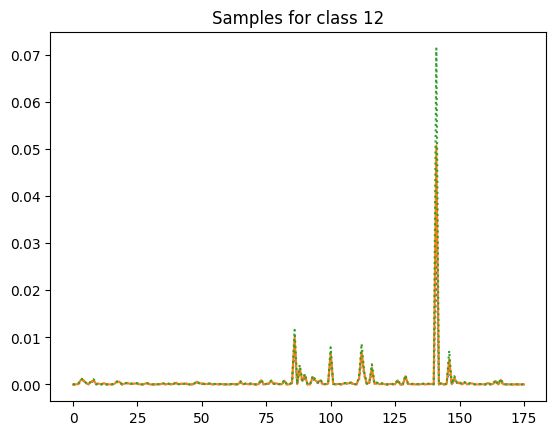

 46%|█████████████████████████████████▌                                       | 45999/100000 [56:48<1:01:45, 14.57it/s]

Iter-46000; D_loss: -0.008083514869213104; G_loss: -19.094247817993164; C_loss: 0.0681157186627388


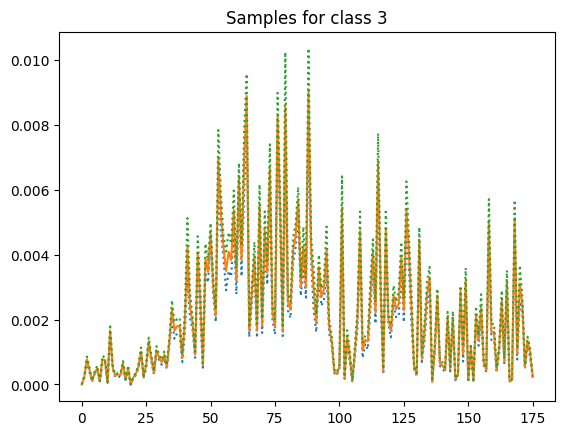

 47%|██████████████████████████████████▎                                      | 47000/100000 [58:02<1:02:50, 14.06it/s]

Iter-47000; D_loss: -0.011021459475159645; G_loss: -19.377355575561523; C_loss: 0.00956385675817728


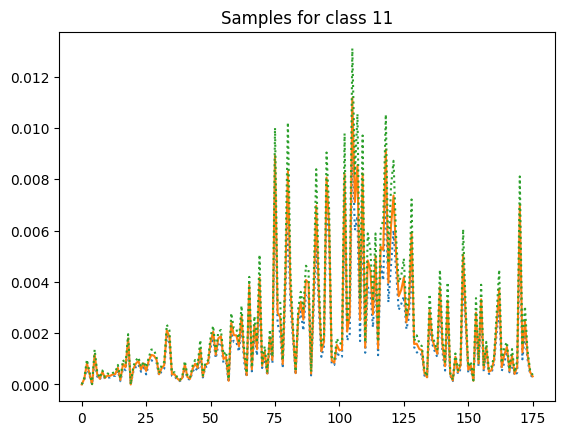

 48%|███████████████████████████████████                                      | 47999/100000 [59:17<1:06:59, 12.94it/s]

Iter-48000; D_loss: -0.0034695155918598175; G_loss: -20.607872009277344; C_loss: 0.026997210457921028


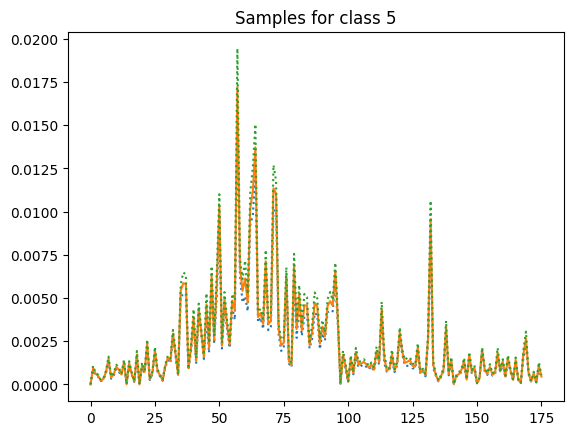

 49%|███████████████████████████████████▊                                     | 48999/100000 [1:00:31<56:09, 15.14it/s]

Iter-49000; D_loss: -0.000795227475464344; G_loss: -21.510082244873047; C_loss: 0.01231379620730877


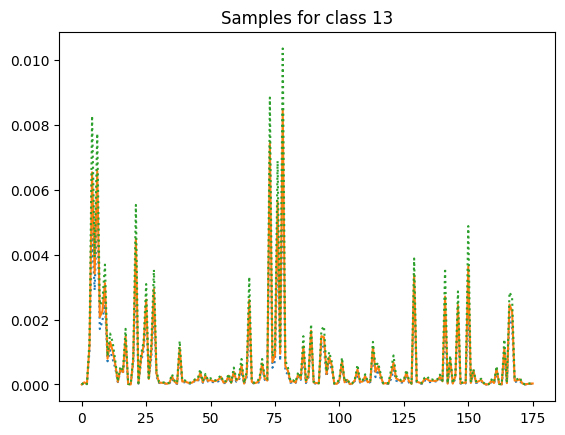

 50%|████████████████████████████████████▌                                    | 50000/100000 [1:01:44<56:14, 14.82it/s]

Iter-50000; D_loss: -0.005758523475378752; G_loss: -23.107656478881836; C_loss: 0.0976984053850174


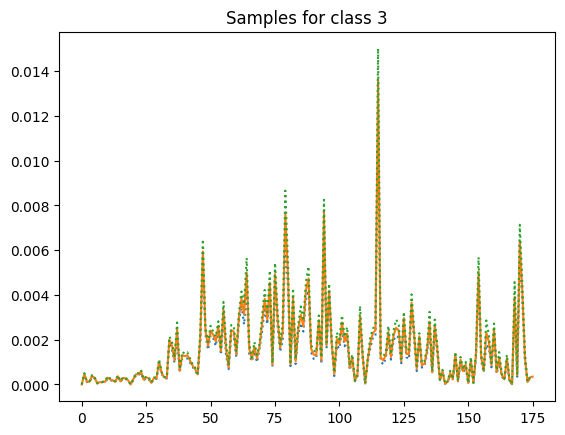

 51%|████████████████████████████████████▏                                  | 50999/100000 [1:02:59<1:05:53, 12.39it/s]

Iter-51000; D_loss: -0.008605483919382095; G_loss: -24.328153610229492; C_loss: 0.030271731317043304


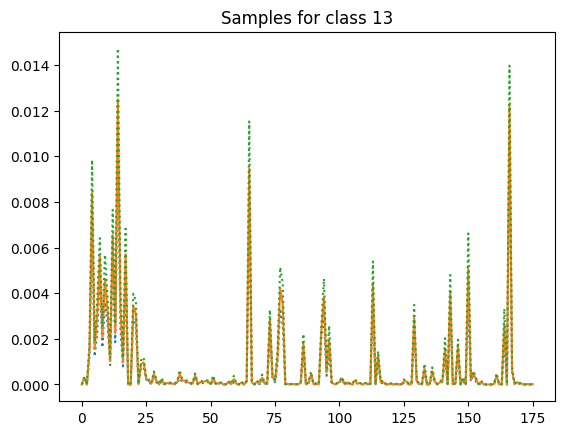

 52%|████████████████████████████████████▉                                  | 52000/100000 [1:04:13<1:03:19, 12.63it/s]

Iter-52000; D_loss: -0.01635562814772129; G_loss: -23.147136688232422; C_loss: 0.04634524881839752


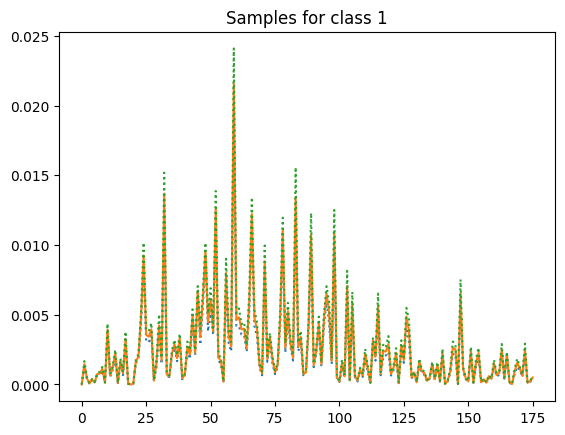

 53%|██████████████████████████████████████▋                                  | 52999/100000 [1:05:27<54:56, 14.26it/s]

Iter-53000; D_loss: -0.005333395209163427; G_loss: -24.501243591308594; C_loss: 0.021983975544571877


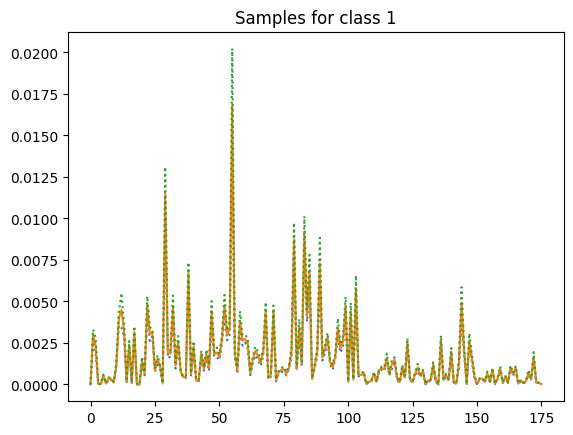

 54%|███████████████████████████████████████▍                                 | 53999/100000 [1:06:42<58:45, 13.05it/s]

Iter-54000; D_loss: -0.014248679392039776; G_loss: -23.47842025756836; C_loss: 0.017627345398068428


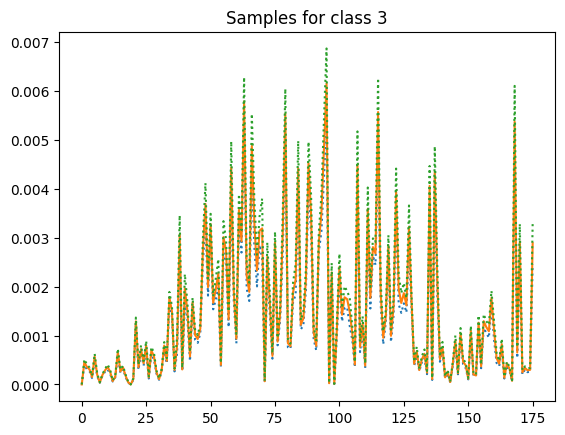

 55%|████████████████████████████████████████▏                                | 55000/100000 [1:07:57<57:35, 13.02it/s]

Iter-55000; D_loss: -0.005390211474150419; G_loss: -24.84479331970215; C_loss: 0.5205215215682983


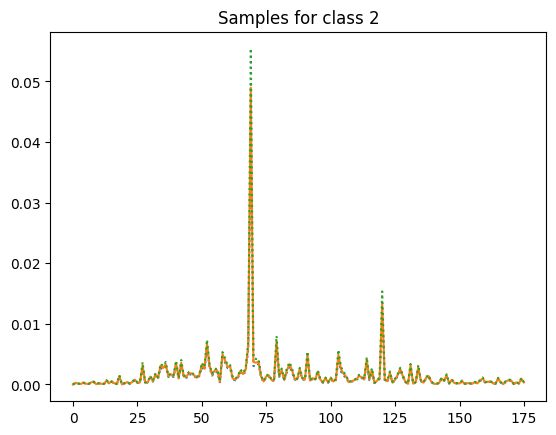

 56%|████████████████████████████████████████▉                                | 56000/100000 [1:09:11<55:07, 13.30it/s]

Iter-56000; D_loss: -0.011975526809692383; G_loss: -24.94786262512207; C_loss: 0.014195997267961502


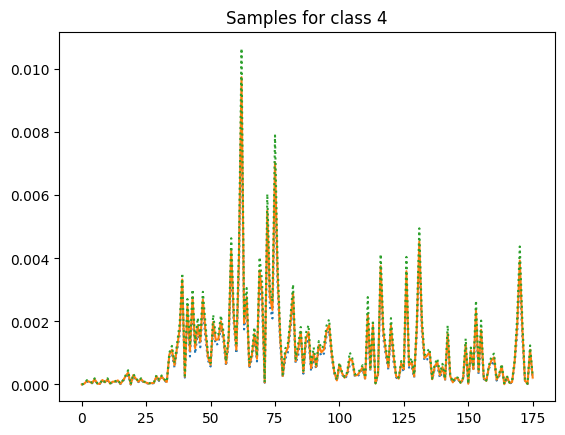

 57%|█████████████████████████████████████████▌                               | 57000/100000 [1:10:25<48:03, 14.91it/s]

Iter-57000; D_loss: -0.012825561687350273; G_loss: -26.014745712280273; C_loss: 0.08045777678489685


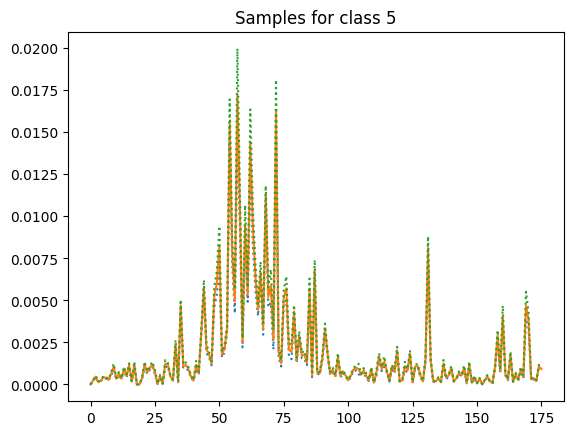

 58%|██████████████████████████████████████████▎                              | 58000/100000 [1:11:39<53:18, 13.13it/s]

Iter-58000; D_loss: -0.02116360329091549; G_loss: -26.98394775390625; C_loss: 0.15639908611774445


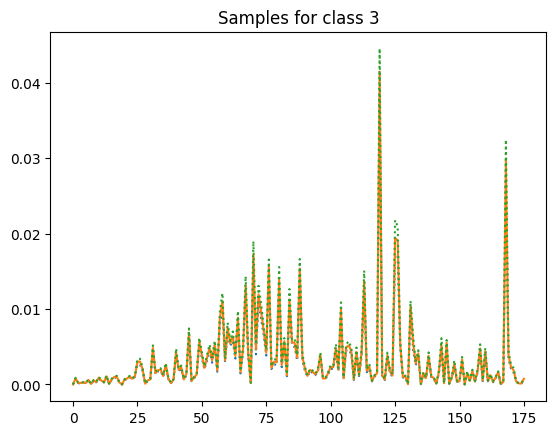

 59%|███████████████████████████████████████████                              | 58999/100000 [1:12:53<47:43, 14.32it/s]

Iter-59000; D_loss: -0.004248613491654396; G_loss: -27.588197708129883; C_loss: 0.013721496798098087


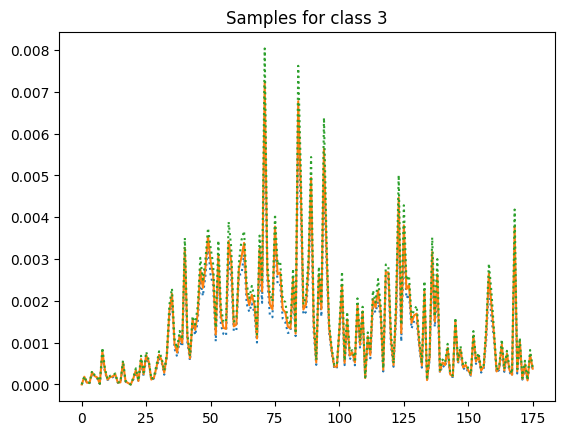

 60%|███████████████████████████████████████████▊                             | 60000/100000 [1:14:07<48:30, 13.74it/s]

Iter-60000; D_loss: -0.0065446700900793076; G_loss: -27.577621459960938; C_loss: 0.011795432306826115


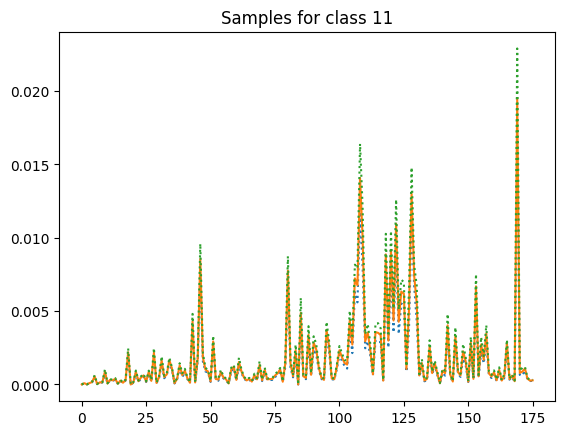

 61%|████████████████████████████████████████████▌                            | 60999/100000 [1:15:21<45:00, 14.44it/s]

Iter-61000; D_loss: -0.008642894215881824; G_loss: -27.645751953125; C_loss: 0.022328687831759453


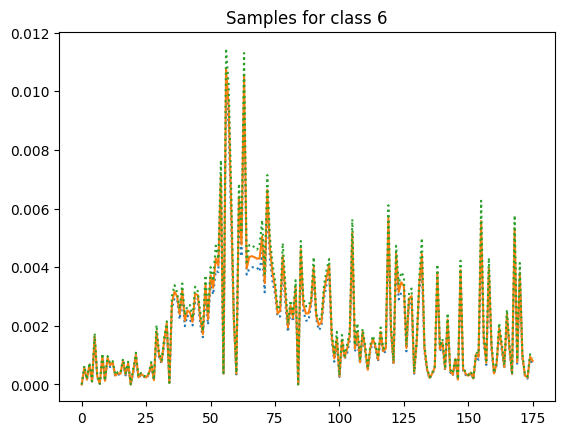

 62%|█████████████████████████████████████████████▎                           | 61999/100000 [1:16:35<45:25, 13.94it/s]

Iter-62000; D_loss: -0.0085147051140666; G_loss: -27.763687133789062; C_loss: 0.008224810473620892


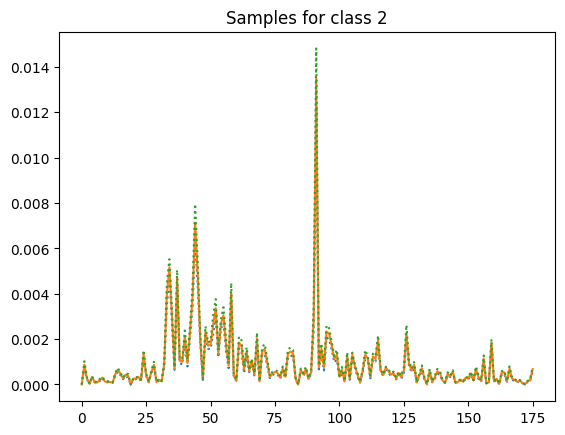

 63%|█████████████████████████████████████████████▉                           | 63000/100000 [1:17:48<45:50, 13.45it/s]

Iter-63000; D_loss: -0.004958959762006998; G_loss: -28.301132202148438; C_loss: 0.017044423148036003


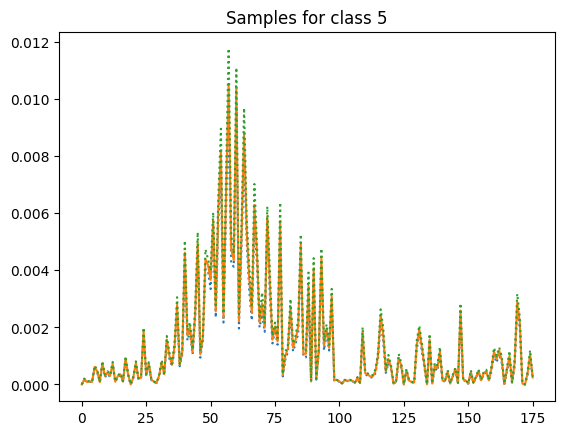

 64%|██████████████████████████████████████████████▋                          | 63999/100000 [1:19:03<49:08, 12.21it/s]

Iter-64000; D_loss: -0.004920463543385267; G_loss: -29.40315818786621; C_loss: 0.10985727608203888


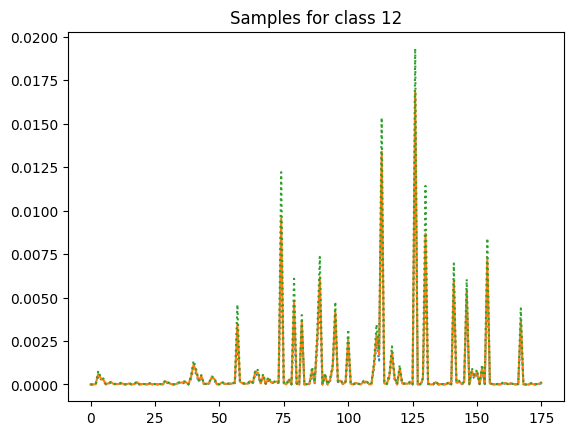

 65%|███████████████████████████████████████████████▍                         | 64999/100000 [1:20:18<43:29, 13.41it/s]

Iter-65000; D_loss: 0.018912184983491898; G_loss: -28.213411331176758; C_loss: 0.053288783878088


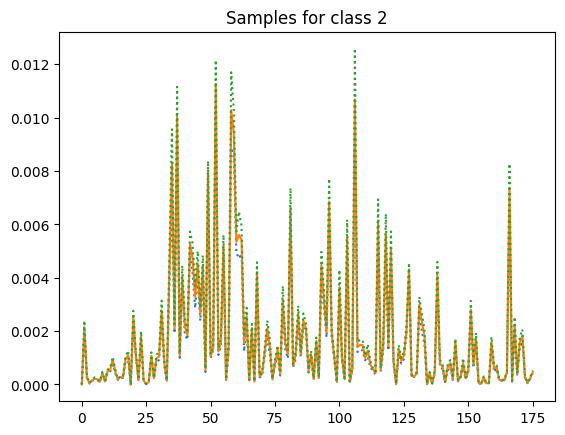

 66%|████████████████████████████████████████████████▏                        | 66000/100000 [1:21:31<45:15, 12.52it/s]

Iter-66000; D_loss: -0.009936532005667686; G_loss: -28.29627799987793; C_loss: 0.4264139235019684


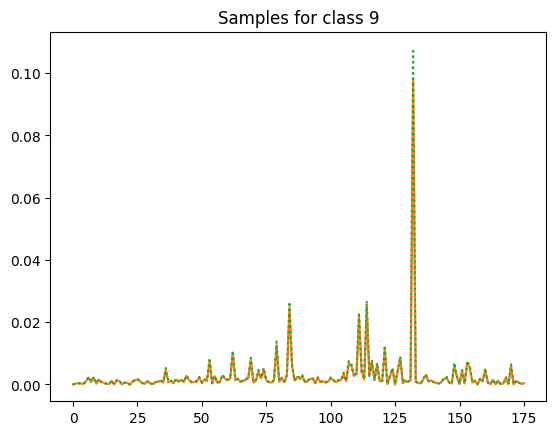

 67%|████████████████████████████████████████████████▉                        | 66999/100000 [1:22:47<43:47, 12.56it/s]

Iter-67000; D_loss: -0.006617678329348564; G_loss: -29.769784927368164; C_loss: 0.02959924191236496


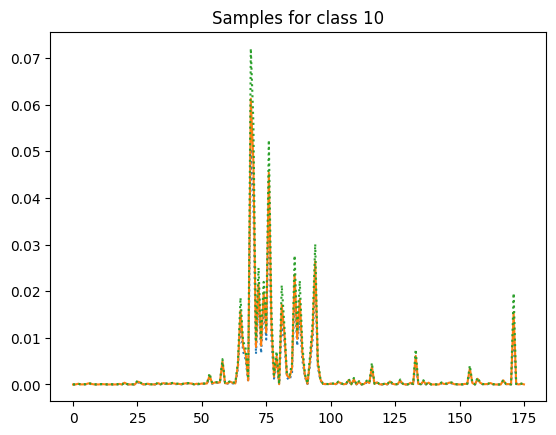

 68%|█████████████████████████████████████████████████▋                       | 67999/100000 [1:24:02<39:46, 13.41it/s]

Iter-68000; D_loss: -0.008762371726334095; G_loss: -29.516130447387695; C_loss: 0.01245178934186697


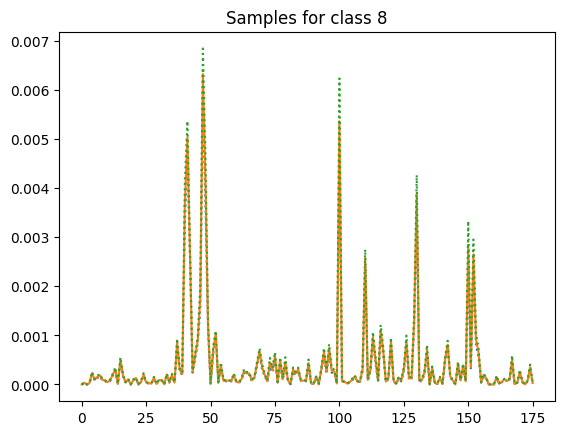

 69%|██████████████████████████████████████████████████▎                      | 69000/100000 [1:25:16<34:53, 14.81it/s]

Iter-69000; D_loss: -0.011255962774157524; G_loss: -28.92596435546875; C_loss: 0.012523235753178596


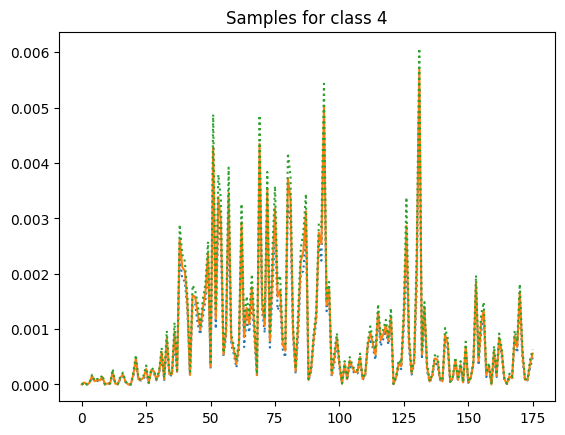

 70%|███████████████████████████████████████████████████                      | 69999/100000 [1:26:31<37:44, 13.25it/s]

Iter-70000; D_loss: 0.27265894412994385; G_loss: -29.42598533630371; C_loss: 0.49728864431381226


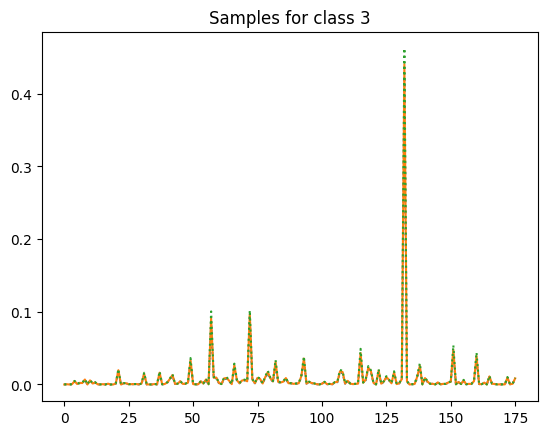

 71%|███████████████████████████████████████████████████▊                     | 71000/100000 [1:27:46<34:44, 13.91it/s]

Iter-71000; D_loss: -0.0014992537908256054; G_loss: -30.283506393432617; C_loss: 0.017146483063697815


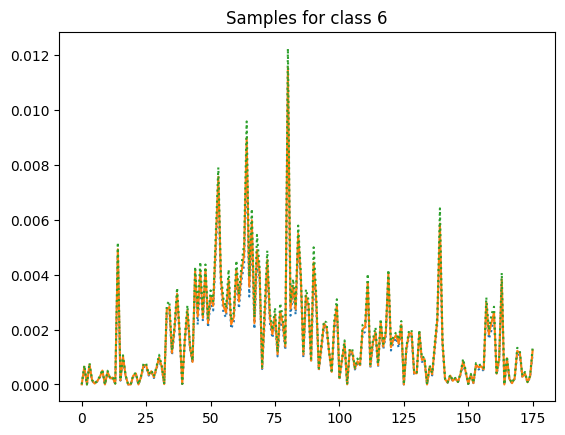

 72%|████████████████████████████████████████████████████▌                    | 71999/100000 [1:28:59<37:21, 12.49it/s]

Iter-72000; D_loss: -0.006600688211619854; G_loss: -29.85602378845215; C_loss: 0.02310420759022236


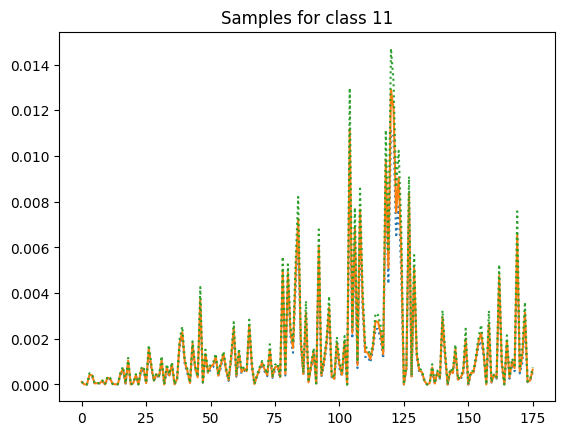

 73%|█████████████████████████████████████████████████████▎                   | 72999/100000 [1:30:14<31:37, 14.23it/s]

Iter-73000; D_loss: -0.0034802183508872986; G_loss: -31.71276092529297; C_loss: 0.016835520043969154


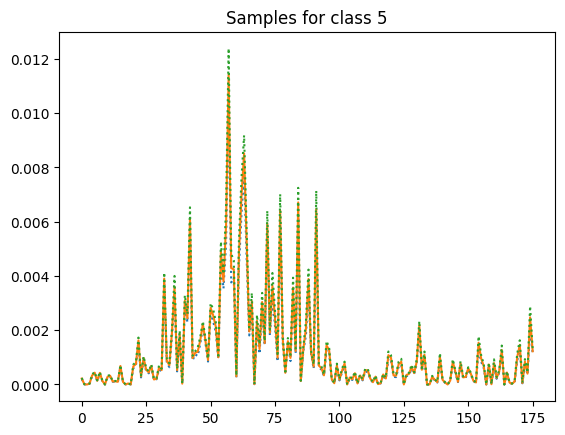

 74%|██████████████████████████████████████████████████████                   | 74000/100000 [1:31:29<35:37, 12.17it/s]

Iter-74000; D_loss: -0.007565109059214592; G_loss: -31.155263900756836; C_loss: 0.0822954997420311


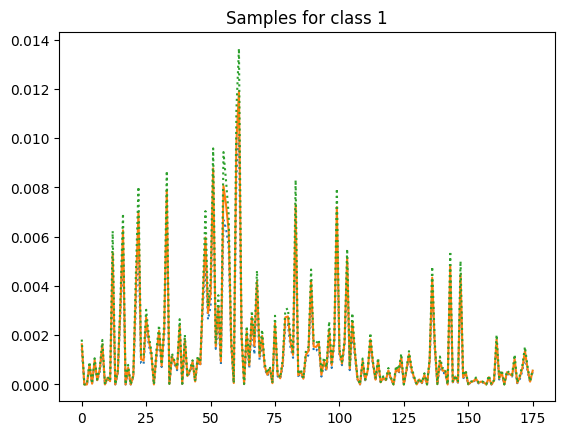

 75%|██████████████████████████████████████████████████████▋                  | 74999/100000 [1:32:44<29:09, 14.29it/s]

Iter-75000; D_loss: -0.013539347797632217; G_loss: -32.14932632446289; C_loss: 0.02067834697663784


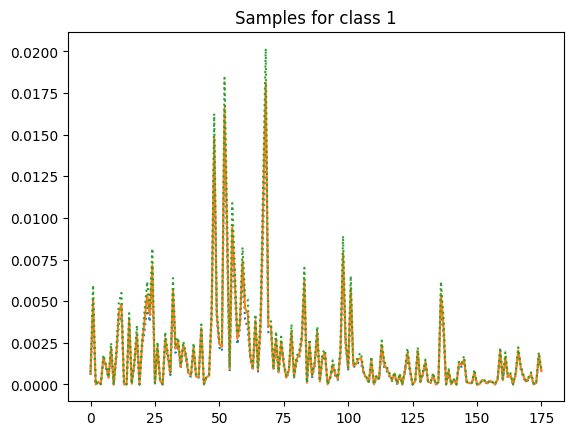

 76%|███████████████████████████████████████████████████████▍                 | 76000/100000 [1:33:59<27:54, 14.33it/s]

Iter-76000; D_loss: -0.004923336207866669; G_loss: -31.31624412536621; C_loss: 0.0493759848177433


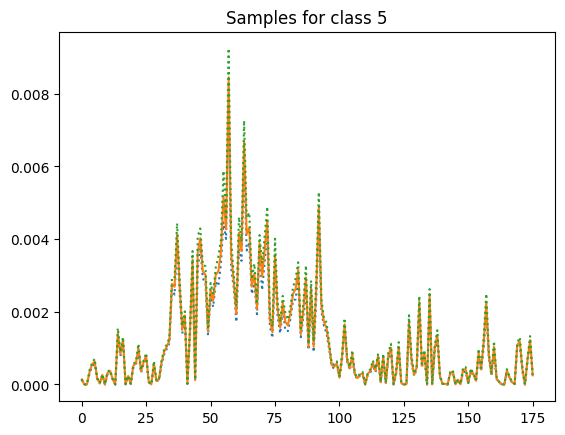

 77%|████████████████████████████████████████████████████████▏                | 77000/100000 [1:35:14<25:56, 14.78it/s]

Iter-77000; D_loss: -0.00861732754856348; G_loss: -32.3288688659668; C_loss: 0.053856782615184784


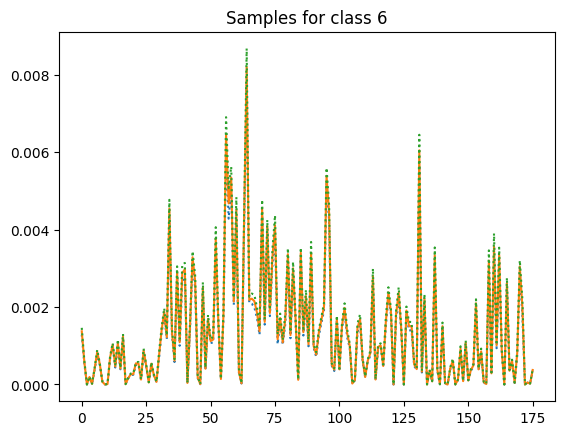

 78%|████████████████████████████████████████████████████████▉                | 78000/100000 [1:36:30<26:19, 13.93it/s]

Iter-78000; D_loss: -0.0028860755264759064; G_loss: -31.72016143798828; C_loss: 0.046226631850004196


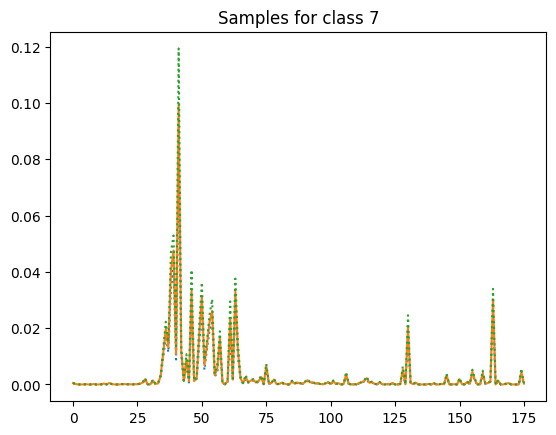

 79%|█████████████████████████████████████████████████████████▋               | 78999/100000 [1:37:44<24:00, 14.58it/s]

Iter-79000; D_loss: -0.00826377421617508; G_loss: -32.7382926940918; C_loss: 0.029998410493135452


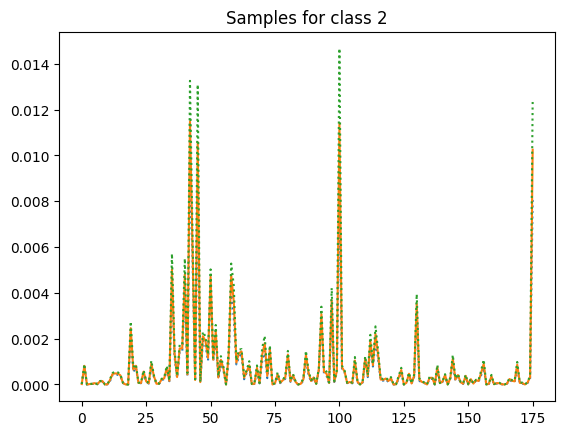

 80%|██████████████████████████████████████████████████████████▍              | 80000/100000 [1:38:58<23:18, 14.31it/s]

Iter-80000; D_loss: -0.006630535237491131; G_loss: -34.24024963378906; C_loss: 0.039997585117816925


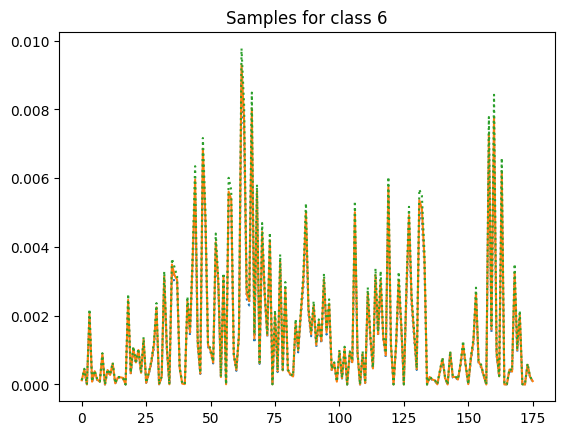

 81%|███████████████████████████████████████████████████████████▏             | 81000/100000 [1:40:13<23:23, 13.54it/s]

Iter-81000; D_loss: -0.009183617308735847; G_loss: -34.14320755004883; C_loss: 0.01711581088602543


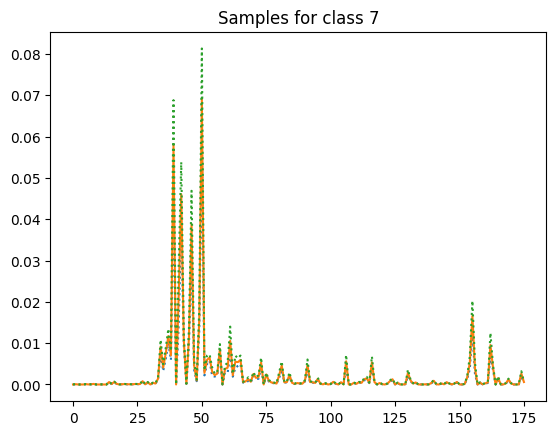

 82%|███████████████████████████████████████████████████████████▊             | 82000/100000 [1:41:28<22:26, 13.37it/s]

Iter-82000; D_loss: -0.009523025713860989; G_loss: -34.039451599121094; C_loss: 0.015422630123794079


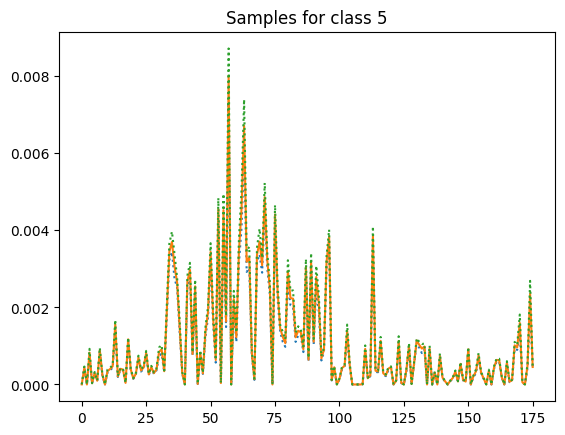

 83%|████████████████████████████████████████████████████████████▌            | 83000/100000 [1:42:43<22:06, 12.81it/s]

Iter-83000; D_loss: -0.013073865324258804; G_loss: -36.2144660949707; C_loss: 0.023832662031054497


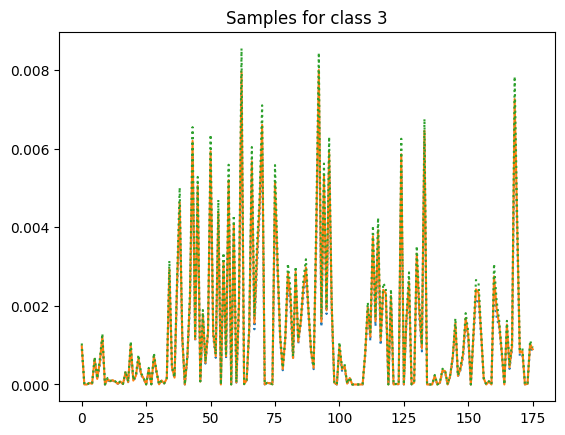

 84%|█████████████████████████████████████████████████████████████▎           | 83999/100000 [1:43:58<19:42, 13.54it/s]

Iter-84000; D_loss: -0.006487964652478695; G_loss: -35.87840270996094; C_loss: 0.01898294873535633


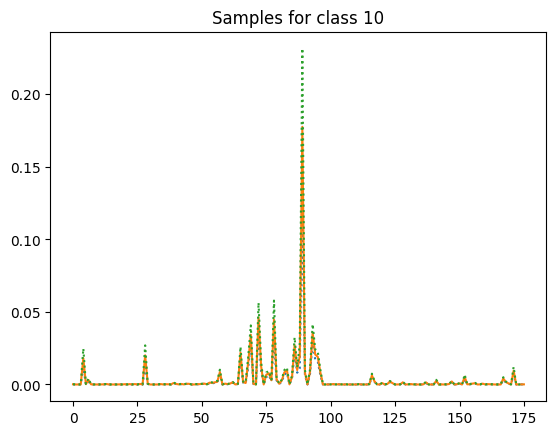

 85%|██████████████████████████████████████████████████████████████           | 85000/100000 [1:45:12<17:45, 14.08it/s]

Iter-85000; D_loss: -0.008845358155667782; G_loss: -35.82979202270508; C_loss: 0.02785477042198181


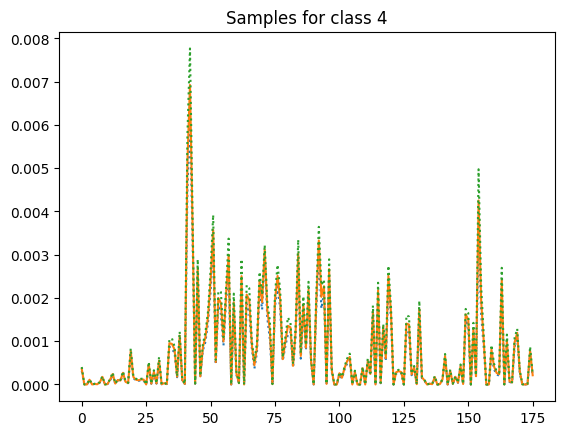

 86%|██████████████████████████████████████████████████████████████▊          | 85999/100000 [1:46:27<20:37, 11.31it/s]

Iter-86000; D_loss: -0.007264126092195511; G_loss: -35.90534973144531; C_loss: 0.05747552216053009


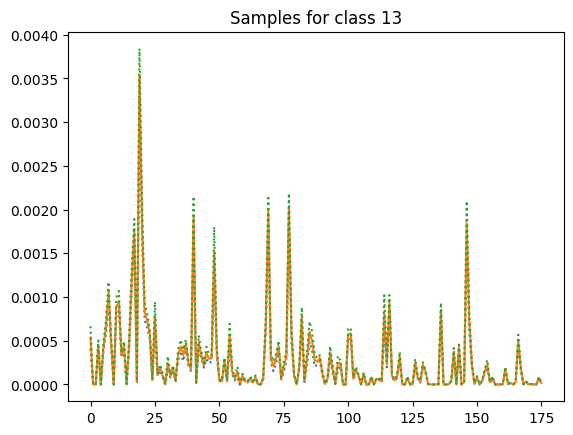

 87%|███████████████████████████████████████████████████████████████▌         | 86999/100000 [1:47:42<14:50, 14.61it/s]

Iter-87000; D_loss: -0.010758140124380589; G_loss: -36.56060028076172; C_loss: 0.06543843448162079


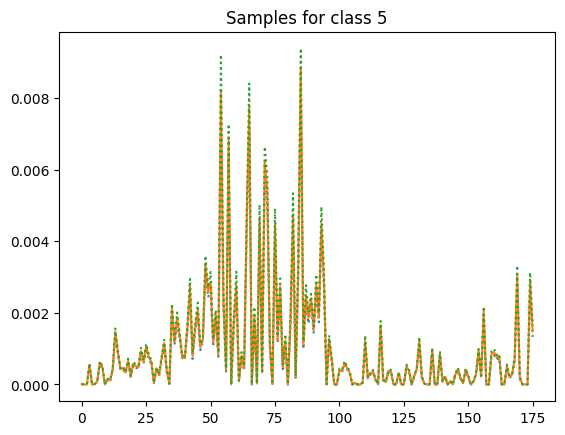

 88%|████████████████████████████████████████████████████████████████▏        | 87999/100000 [1:48:57<15:38, 12.78it/s]

Iter-88000; D_loss: -0.013738459907472134; G_loss: -37.3088264465332; C_loss: 0.05669095367193222


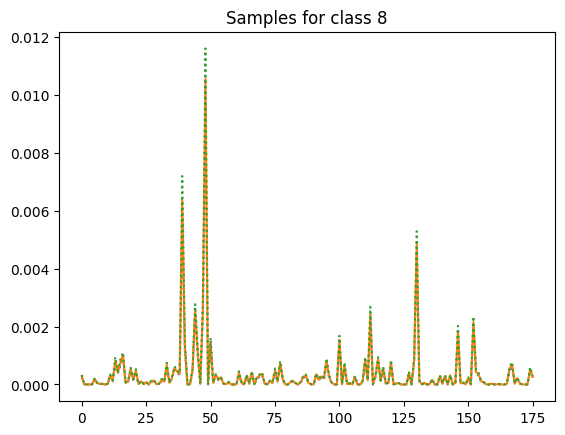

 89%|████████████████████████████████████████████████████████████████▉        | 88999/100000 [1:50:11<13:21, 13.73it/s]

Iter-89000; D_loss: -0.015100114978849888; G_loss: -38.104434967041016; C_loss: 0.027246732264757156


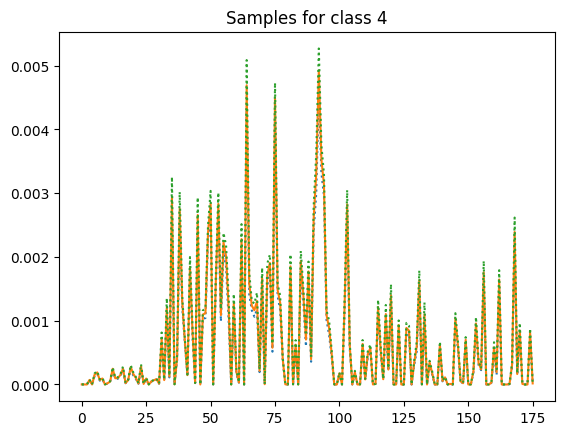

 90%|█████████████████████████████████████████████████████████████████▋       | 90000/100000 [1:51:26<12:18, 13.55it/s]

Iter-90000; D_loss: -0.02339140884578228; G_loss: -38.75474548339844; C_loss: 0.035794924944639206


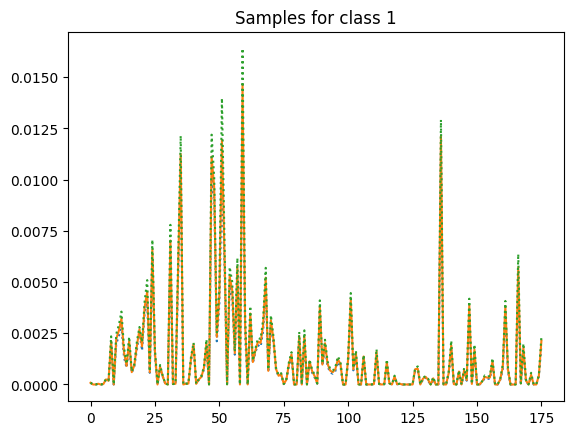

 91%|██████████████████████████████████████████████████████████████████▍      | 91000/100000 [1:52:40<11:45, 12.75it/s]

Iter-91000; D_loss: -0.02131870947778225; G_loss: -39.3677864074707; C_loss: 0.05981675907969475


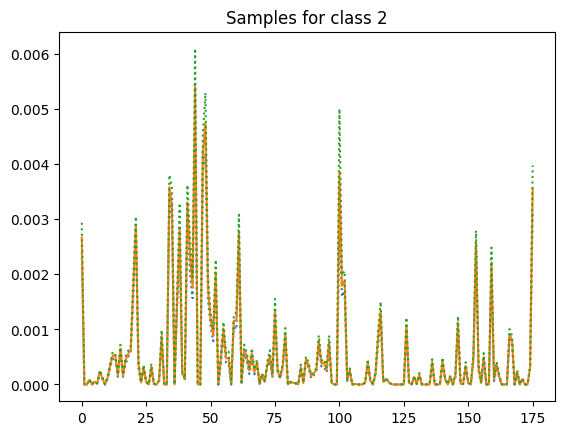

 92%|███████████████████████████████████████████████████████████████████▏     | 91999/100000 [1:53:55<09:54, 13.46it/s]

Iter-92000; D_loss: -0.010860007256269455; G_loss: -39.80921173095703; C_loss: 0.2817646563053131


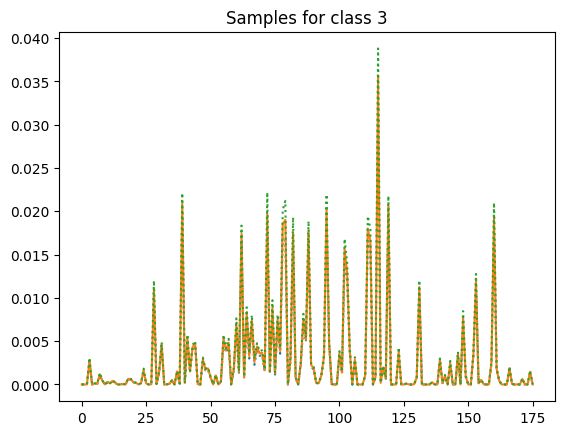

 93%|███████████████████████████████████████████████████████████████████▉     | 93000/100000 [1:55:10<08:20, 13.99it/s]

Iter-93000; D_loss: -0.01905406080186367; G_loss: -40.16317367553711; C_loss: 0.04029461368918419


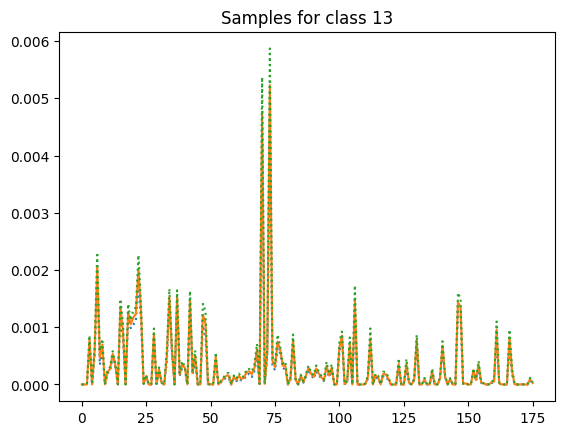

 94%|████████████████████████████████████████████████████████████████████▌    | 94000/100000 [1:56:25<06:54, 14.48it/s]

Iter-94000; D_loss: -0.01725326105952263; G_loss: -40.848907470703125; C_loss: 0.019528085365891457


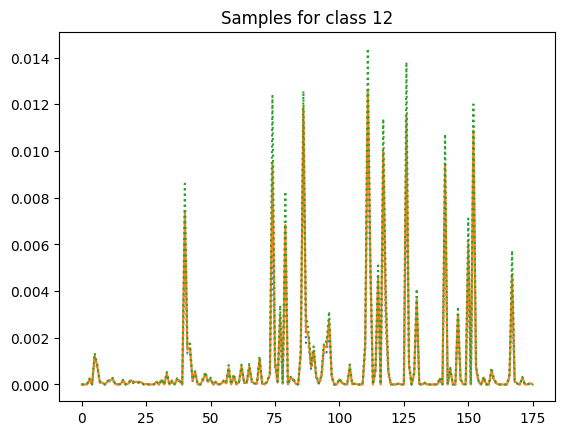

 95%|█████████████████████████████████████████████████████████████████████▎   | 94999/100000 [1:57:40<06:34, 12.69it/s]

Iter-95000; D_loss: -0.02518145926296711; G_loss: -41.63887405395508; C_loss: 0.061432890594005585


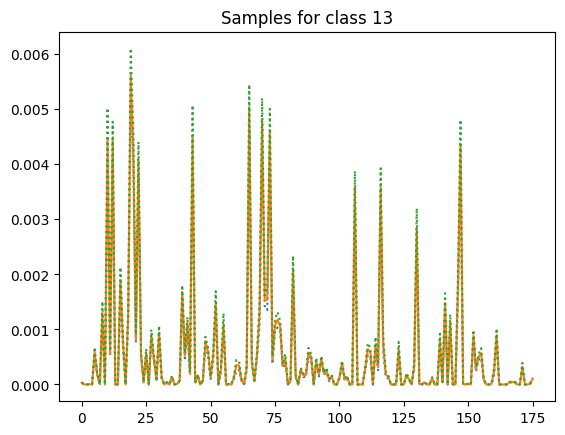

 96%|██████████████████████████████████████████████████████████████████████   | 96000/100000 [1:58:54<05:21, 12.46it/s]

Iter-96000; D_loss: -0.020553991198539734; G_loss: -42.02205276489258; C_loss: 0.026665808632969856


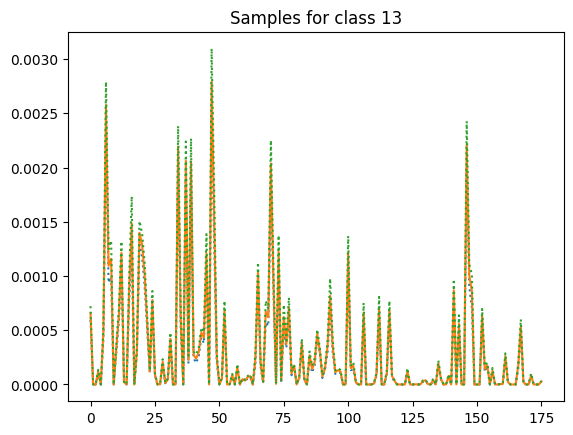

 97%|██████████████████████████████████████████████████████████████████████▊  | 96999/100000 [2:00:10<03:39, 13.67it/s]

Iter-97000; D_loss: -0.021809441968798637; G_loss: -42.672950744628906; C_loss: 0.06797576695680618


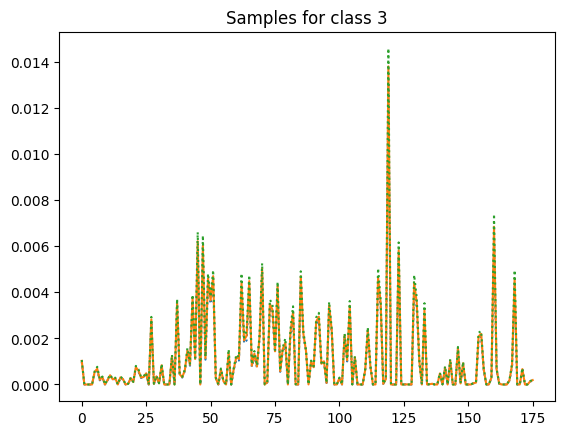

 98%|███████████████████████████████████████████████████████████████████████▌ | 97999/100000 [2:01:25<02:29, 13.43it/s]

Iter-98000; D_loss: -0.020558997988700867; G_loss: -43.70490646362305; C_loss: 0.12570296227931976


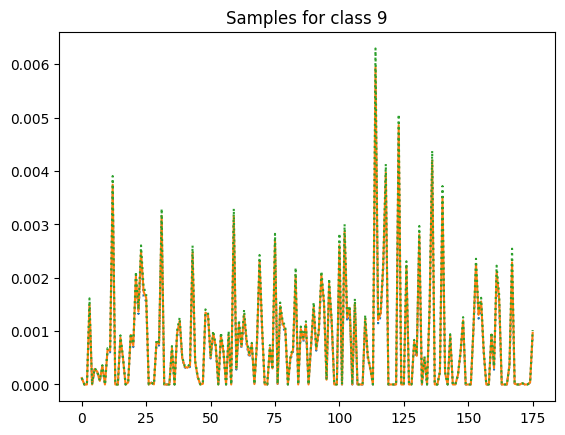

 99%|████████████████████████████████████████████████████████████████████████▎| 98999/100000 [2:02:39<01:13, 13.55it/s]

Iter-99000; D_loss: -0.018113501369953156; G_loss: -44.890037536621094; C_loss: 0.035286445170640945


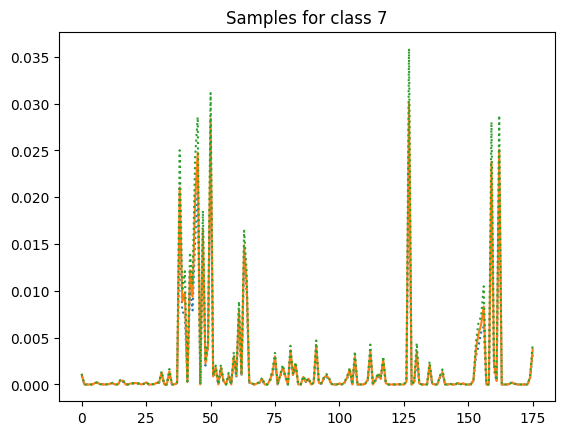

100%|████████████████████████████████████████████████████████████████████████| 100000/100000 [2:03:55<00:00, 13.45it/s]


In [9]:
import torch.optim as optim
# Get networks
G = Generator().cuda()
D = Discriminator().cuda()
C = Classifier().cuda()
# Use RMSProp optimizer
G_solver = optim.RMSprop(G.parameters(), lr=lr)
D_solver = optim.RMSprop(D.parameters(), lr=lr)
C_solver = optim.RMSprop(C.parameters(), lr=lr)

for it in tqdm(range(100000)):
    ###########################
    # (1) Update C and D      #
    ###########################
    for p in D.parameters():  # reset requires_grad
        p.requires_grad = True  # they are set to False below in netG update
    for p in C.parameters():
        p.requires_grad = True
    
    # D is trained d_step times for each iteration
    for _, (X, y), (X_, y_) in zip(range(d_step), data_loader, data_loader):
        D.zero_grad()

        # Sample random noise
        z = torch.randn(y.size(0), z_dim).squeeze()
        X, y = X.float(), y.float()
        X_, y_ = X_.float(), y_.float()
        # Mixup
        lam = np.random.beta(mixup_alpha, mixup_alpha)
        X = lam*X + (1. - lam)*X_
        X, y, z = X.cuda(), y.cuda(), z.cuda()
        y_ = y_.cuda()
        
        # Get discriminator prediction on real samples
        D_real = D(X).mean()
        # Get discriminator prediction on fake samples
        fake_samples = G(z, y)
        D_fake = D(fake_samples).mean()
        # Compute gradient penalty
        gradient_penalty = calc_gradient_penalty(D, X.data, fake_samples.data)
        # Compute loss and backpropagate
        D_loss = D_fake - D_real + gradient_penalty
        flip = np.random.random() < flip_percentage
        if flip: 
            # Flip real and fake
            gradient_penalty = calc_gradient_penalty(D, fake_samples.data, X.data)
            D_loss = D_real - D_fake + gradient_penalty
        D_loss.backward()
        D_solver.step()
    
        ######################
        #  Update C network  #
        ######################
        C.zero_grad()
        # Get class values
        _, classes = torch.max(y, dim=1)
        _, classes_ = torch.max(y_, dim=1)
        # Get predictions from C
        if flip:
            fake_samples = G(z, y)
            pred = C(fake_samples)
            # Compute loss and backpropagate
            C_loss = F.cross_entropy(pred, classes, weight=class_weights)
        else:
            pred = F.log_softmax(C(X))
            C_loss = lam * F.nll_loss(pred, classes) + (1. - lam) * F.nll_loss(pred, classes_)
        C_loss.backward()
        C_solver.step()


    ############################
    # (2) Update G network
    ###########################
    for p in D.parameters():
        p.requires_grad = False  # to avoid computation
    for p in C.parameters():
        p.requires_grad = False
    reset_grad(C, G, D)

    # Sample random noise
    z = torch.randn(y.size(0), z_dim).squeeze()
    z = z.cuda()
    # Generate fake samples
    G_sample = G(z, y)
    D_fake = D(G_sample)
    pred = C(G_sample)
    C_loss = F.cross_entropy(pred, classes, weight=class_weights)
    # Fool the discriminator (WGAN)
    G_loss = -torch.mean(D_fake)
    # Include the auxialiary classifier loss (AC-GAN)
    loss = G_loss + c_weight * C_loss
    # Backpropagate
    loss.backward()
    G_solver.step()

    # Print and plot every now and then
    if it % 1000 == 0:
        with torch.no_grad():
            print('Iter-{}; D_loss: {}; G_loss: {}; C_loss: {}'.format(it,
                                                           D_loss.data.cpu().numpy(), G_loss.data.cpu().numpy(),
                                                           C_loss.data.cpu().numpy()))
            z = torch.randn(mb_size, z_dim).squeeze().cuda()
            c = np.zeros(shape=[mb_size, c_dim], dtype='float32')
            idx = np.random.randint(1, data_loader.dataset.n_classes)
            c[:, idx] = 1.
            c = torch.from_numpy(c).squeeze().cuda()
            samples = G(z, c).data.cpu().numpy()[:16]
            pred = G(z, c)
            plot_mean_std(samples)
            plt.title("Samples for class {}".format(idx))
            plt.show()


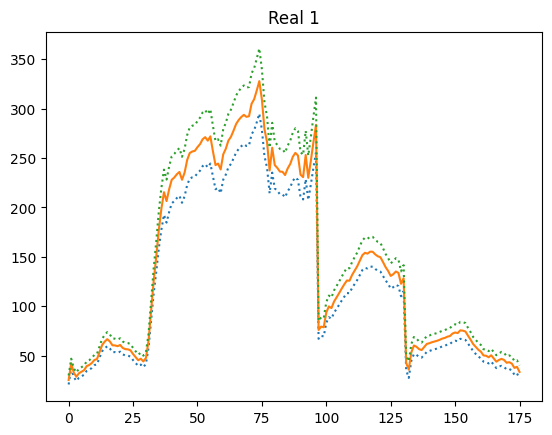

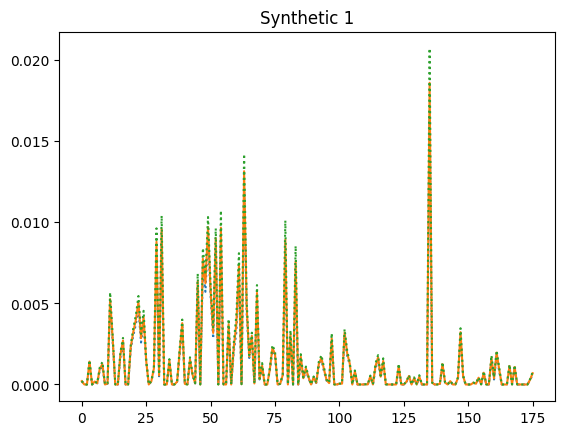

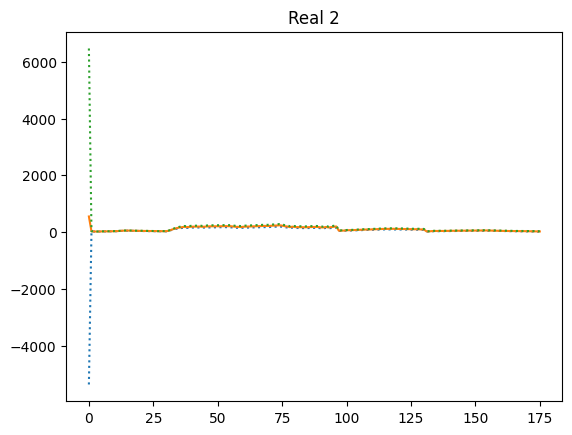

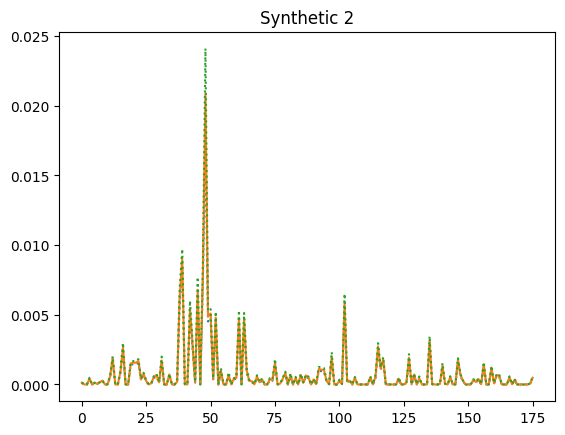

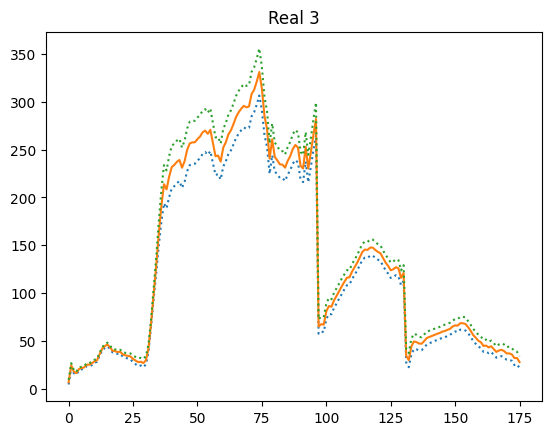

...

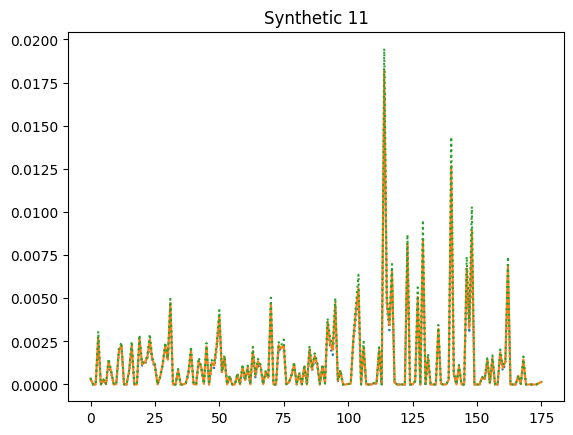

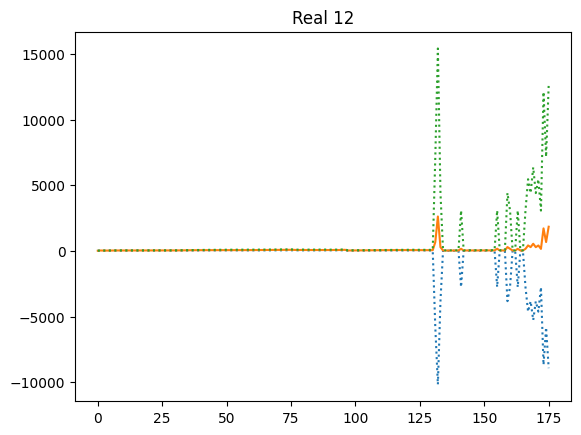

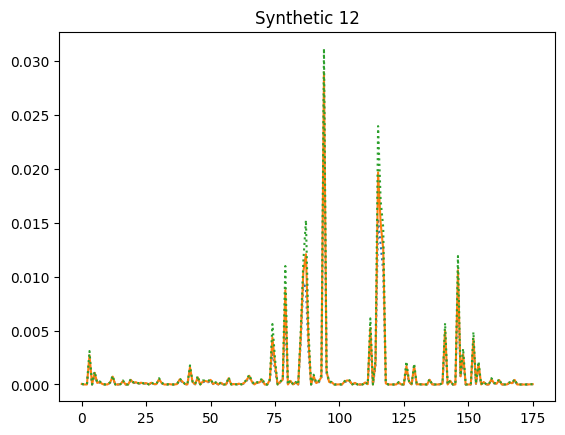

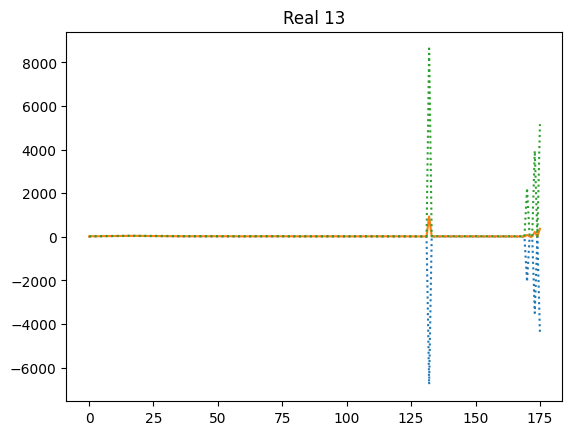

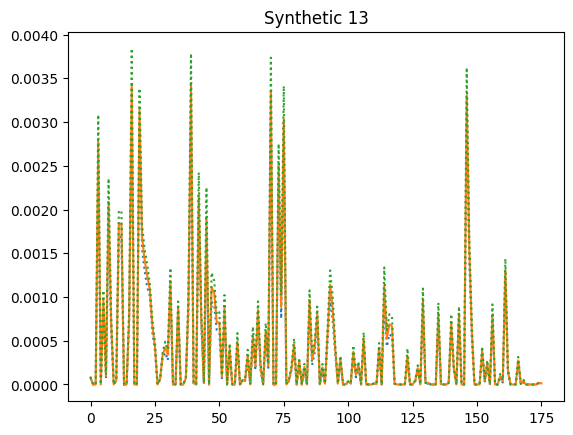

In [10]:
for c in np.unique(gt):
    # 0 is the "undefined" class
    if c == 0:
        continue
    
    # Get the mean spectrum +- std for this class
    spectras = img[gt == c, :]
    plot_mean_std(spectras)
    plt.title("Real {}".format(c))
    plt.show()
    
    # Get as many fake spectras as real ones
    synthetic_spectras = []
    with torch.no_grad():
        while len(synthetic_spectras) < len(spectras):
            z = torch.randn(mb_size, z_dim).cuda()
            y = torch.from_numpy(np.eye(data_loader.dataset.n_classes)[c]).float()
            y = y.unsqueeze(0).repeat(mb_size, 1).cuda()
            G_sample = G(z, y)
            _, classes = torch.max(y, 1)
            _, pred = torch.max(C(G_sample), 1)
            synthetic_spectras += list(G_sample.cpu().data.numpy())
    plt.show()
    plot_mean_std(synthetic_spectras)
    plt.title("Synthetic {}".format(c))
    plt.show()

In [11]:
import sklearn.svm
import sklearn.model_selection
import sklearn.preprocessing
import sklearn.pipeline
import sklearn.mixture

In [12]:
img = (img - img.min()) / (img.max() - img.min())
X_train = np.array([img[x,y] for x,y in zip(*np.nonzero(train_gt))])
y_train = np.array([gt[x,y] for x,y in zip(*np.nonzero(train_gt))])
X_test = np.array([img[x,y] for x,y in zip(*np.nonzero(test_gt))])
y_test = np.array([test_gt[x,y] for x,y in zip(*np.nonzero(test_gt))])

In [14]:
# gmms = [sklearn.mixture.GaussianMixture(n_components=20) for _ in range(c_dim)]
# for y in np.unique(y_train):
#     gmms[y].fit(X_train[y_train == y])

from sklearn.mixture import GaussianMixture
import numpy as np

# Initialize GMMs
gmms = [None] * c_dim

# Fit GMMs to each class with enough samples
for y in np.unique(y_train):
    # Get the samples for class y
    samples = X_train[y_train == y]
    # Check if there are at least two samples for this class
    if samples.shape[0] >= 2:
        # Set the number of components to be the min between the desired number and the number of samples
        n_components = min(20, samples.shape[0])
        gmms[y] = GaussianMixture(n_components=n_components)
        gmms[y].fit(samples)
    else:
        print(f"Not enough samples for class {y} to fit a GMM.")

In [15]:
def gmm_create_fake_dataset(gmms, y):
    fake_X = []
    y_fake = []
    for y in np.unique(y):
        n_samples = np.count_nonzero(y_test == y)
        samples = gmms[y].sample(n_samples)[0]
        fake_X.append(samples)
        y_fake += [y] * n_samples
    fake_X = np.concatenate(fake_X)
    y_fake = np.array(y_fake)
    return fake_X, y_fake

#fake_X_train, fake_y_train = gmm_create_fake_dataset(gmms, y_train)
#fake_X_test, fake_y_test = gmm_create_fake_dataset(gmms, y_test)

In [16]:
scaler = sklearn.preprocessing.StandardScaler()
svm = sklearn.svm.SVC()
#estimator = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm)])
estimator = sklearn.pipeline.Pipeline(steps=[('svm', svm)])
#tuned_parameters = {'svm__C': [0.1, 1, 10, 100, 1000], 'svm__kernel': ['linear']}
tuned_parameters = {'svm__C': [1000], 'svm__kernel': ['linear']}
clf = sklearn.model_selection.GridSearchCV(estimator, tuned_parameters, cv=5, n_jobs=4)
clf.fit(X_train, y_train)
score = clf.score(X_test, y_test)
best_params = clf.best_params_
print("The best SVM was obtained using {} and performed at {:.2f} accuracy.".format(best_params, 100 * score))

The best SVM was obtained using {'svm__C': 1000, 'svm__kernel': 'linear'} and performed at 48.45 accuracy.


In [17]:
y_pred = clf.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.38      0.96      0.55       723
           2       0.00      0.00      0.00       233
           3       0.00      0.00      0.00       244
           4       0.00      0.00      0.00       238
           5       0.00      0.00      0.00       152
           6       0.00      0.00      0.00       220
           7       0.00      0.00      0.00        98
           8       0.00      0.00      0.00       418
           9       0.42      0.87      0.56       501
          10       0.57      0.08      0.14       390
          11       0.87      0.88      0.88       390
          12       0.19      0.09      0.12       484
          13       0.60      0.98      0.75       883

    accuracy                           0.48      4974
   macro avg       0.23      0.30      0.23      4974
weighted avg       0.34      0.48      0.36      4974



C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [23]:
# def gan_create_fake_dataset(labels):
#     with torch.no_grad():
#         spectras = []
#         for l in np.array_split(labels, len(labels) // mb_size):
#             z = torch.randn(len(l), z_dim).cuda()
#             y = np.zeros((len(l), data_loader.dataset.n_classes))
#             for i, label in enumerate(l):
#                 y[i] = np.eye(data_loader.dataset.n_classes)[label]
#             y = torch.from_numpy(y).float()
#             eps = torch.randn(y.size())/10
#             #y += eps
#             y = y.cuda()
#             G_sample = G(z, y)
#             spectras += list(G_sample.cpu().data.numpy())
#         return np.array(spectras), np.array(labels)


def gan_create_fake_dataset(labels):
    with torch.no_grad():
        spectras = []
        # Ensure at least 1 section by using max function
        num_sections = max(1, len(labels) // mb_size)
        for l in np.array_split(labels, num_sections):
            z = torch.randn(len(l), z_dim).cuda()
            y = np.zeros((len(l), data_loader.dataset.n_classes))
            for i, label in enumerate(l):
                y[i] = np.eye(data_loader.dataset.n_classes)[label]
            y = torch.from_numpy(y).float()
            eps = torch.randn(y.size()) / 10
            # Uncomment the next line if you want to add noise to y
            # y += eps
            y = y.cuda()
            G_sample = G(z, y)
            spectras += list(G_sample.cpu().data.numpy())
        return np.array(spectras), np.array(labels)


In [24]:
fake_X_train, fake_y_train = gan_create_fake_dataset(y_train)
fake_X_test, fake_y_test = gan_create_fake_dataset(y_test)

In [25]:
clf.score(fake_X_test, fake_y_test)

0.24668275030156817

In [26]:
y_fake_pred = clf.predict(fake_X_test)
from sklearn.metrics import classification_report
print(classification_report(fake_y_test, y_fake_pred))

              precision    recall  f1-score   support

           1       0.01      0.00      0.00       723
           2       0.00      0.00      0.00       233
           3       0.00      0.00      0.00       244
           4       0.00      0.00      0.00       238
           5       0.00      0.00      0.00       152
           6       0.00      0.00      0.00       220
           7       0.00      0.00      0.00        98
           8       0.00      0.00      0.00       418
           9       0.00      0.00      0.00       501
          10       0.00      0.00      0.00       390
          11       0.00      0.00      0.00       390
          12       0.23      0.70      0.35       484
          13       0.57      1.00      0.73       883

    accuracy                           0.25      4974
   macro avg       0.06      0.13      0.08      4974
weighted avg       0.13      0.25      0.16      4974



C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [27]:
svm_fake = sklearn.svm.SVC()
clf_fake = sklearn.pipeline.Pipeline(steps=[('svm', svm_fake)])
clf_fake.set_params(**clf.best_params_)
clf_fake.fit(np.concatenate([fake_X_train]), np.concatenate([fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [28]:
clf_fake.score(fake_X_test, fake_y_test)

1.0

In [29]:
clf_fake.score(X_test, y_test)

0.22356252513067953

In [30]:
svm_augmented = sklearn.svm.SVC()
#clf_augmented = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm_augmented)])
clf_augmented = sklearn.pipeline.Pipeline(steps=[('svm', svm_augmented)])
clf_augmented.set_params(**clf.best_params_)
clf_augmented.fit(np.concatenate([X_train, fake_X_train]), np.concatenate([y_train, fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [31]:
clf_augmented.score(X_test, y_test)

0.48492159227985526

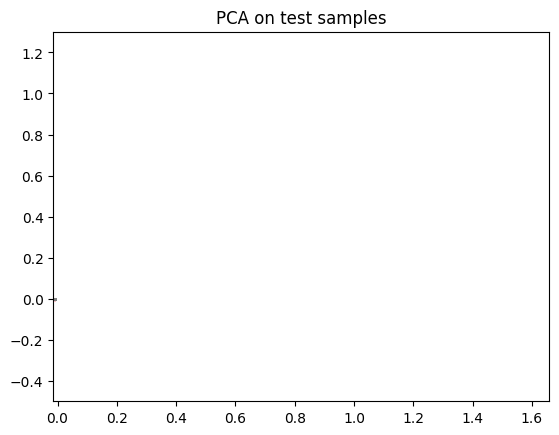

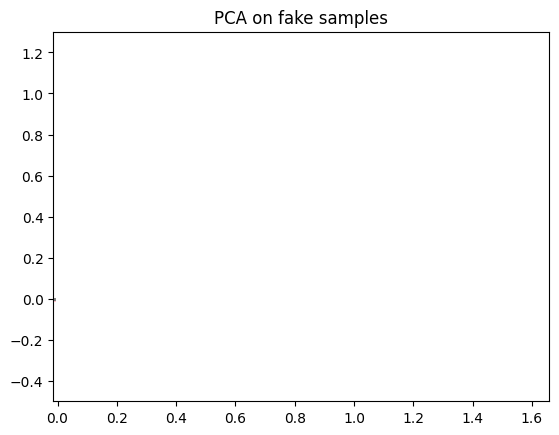

In [32]:
%matplotlib inline
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_test)
x_min, x_max = np.min(X_pca[:,0]), np.max(X_pca[:,0])
y_min, y_max = np.min(X_pca[:,1]), np.max(X_pca[:,1])

colors = ['red', 'blue', 'green', 'yellow', 'brown', 'purple', 'cyan', 'olive', 'pink', 'gray']
for i, color in enumerate(colors):
    idx = y_test == i
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], c=color, s=1)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on test samples')
plt.show()

X_fake_pca = pca.transform(fake_X_test)
for i, color in enumerate(colors):
    idx = fake_y_test == i
    plt.scatter(X_fake_pca[idx, 0], X_fake_pca[idx, 1], s=1, c=color)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on fake samples')
plt.show()

In [33]:
def train(net, X_train, y_train, epochs=100):
    dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_train).float(),
                                             torch.from_numpy(y_train).long())
    loader = torch.utils.data.DataLoader(dataset, batch_size=1024, shuffle=True)
    solver = optim.Adam(net.parameters(), amsgrad=True)
    net.train()
    it = 0
    losses = []
    for _ in tqdm(range(epochs)):
        for X, y in loader:
            it += 1
            net.zero_grad()
            X, y = X.cuda(), y.cuda()
            out = net(X)
            loss = F.cross_entropy(out, y)
            loss.backward()
            solver.step()
            losses.append(loss.item())
            if it % 10000 == 0:
                print("Loss at {} = {}".format(it, loss.item()))
                plt.plot(losses) and plt.show()
    return net

 67%|███████████████████████████████████████████████████▎                         | 9995/15000 [03:22<01:58, 42.09it/s]

Loss at 10000 = 0.061044685542583466


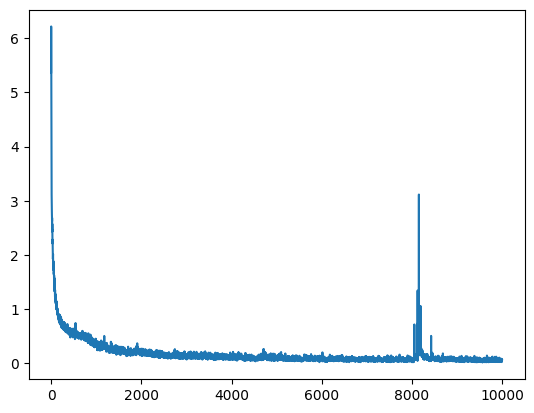

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [05:02<00:00, 49.64it/s]


In [34]:
C_real = train(Classifier().cuda(), X_train, y_train, epochs=15000)

In [35]:
def test(net, X_test, y_test):
    with torch.no_grad():
        net.eval()
        print(X_test.shape)
        print(y_test.shape)
        dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_test).float(),
                                                 torch.from_numpy(y_test).long())
        loader = torch.utils.data.DataLoader(dataset, batch_size=mb_size)
        pred = []
        for X, y in loader:
            X, y = X.cuda(), y.cuda()
            out = net(X)
            _, out = torch.max(out, 1)
            pred.append(out.cpu().numpy())
        pred = np.concatenate(pred)
        print(classification_report(y_test, pred, digits=4))
    return pred

In [36]:
test(C_real, X_test, y_test)

(4974, 176)
(4974,)
              precision    recall  f1-score   support

           1     0.8582    0.9212    0.8886       723
           2     0.6847    0.6524    0.6681       233
           3     0.8469    0.7254    0.7815       244
           4     0.4180    0.4286    0.4232       238
           5     0.6269    0.5526    0.5874       152
           6     0.4449    0.4591    0.4519       220
           7     0.3986    0.6020    0.4797        98
           8     0.7361    0.6675    0.7001       418
           9     0.8503    0.9182    0.8829       501
          10     0.8474    0.6974    0.7651       390
          11     0.9159    0.9769    0.9454       390
          12     0.8008    0.7810    0.7908       484
          13     0.9774    0.9796    0.9785       883

    accuracy                         0.7994      4974
   macro avg     0.7236    0.7201    0.7187      4974
weighted avg     0.8023    0.7994    0.7990      4974



array([12, 12, 12, ..., 10, 10, 10], dtype=int64)

 67%|███████████████████████████████████████████████████▎                         | 9997/15000 [04:27<01:59, 41.72it/s]

Loss at 10000 = 0.10259225964546204


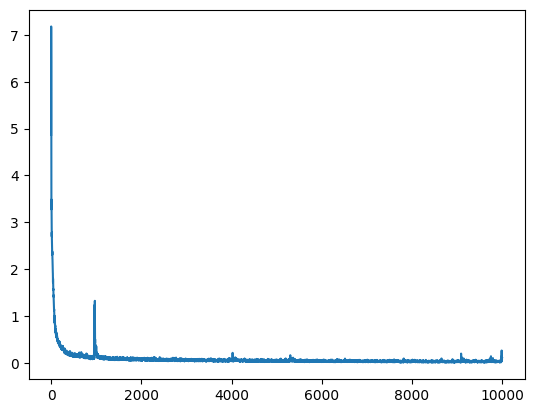

 95%|███████████████████████████████████████████████████████████████████████▊    | 14180/15000 [06:19<00:20, 39.21it/s]

In [ ]:
C_fake = train(Classifier().cuda(), np.concatenate((X_train, fake_X_train)), np.concatenate((y_train, fake_y_train)), epochs=15000)

In [ ]:
test(C_fake, X_test, y_test)